# Introduction
A notebook specifically made for traditional stochastic models:
1. LC (Lee-Carter with Poisson likelihood estimation)
2. RH (Renshaw & Haberman with Poisson likelihood estimation)

The notebook is used to test and implement LC and RH model to forecast cause-of-death mortality rates based on data similar with HMD cause-of-death data (particularly column names and format), but with single-year of age. The estimations for the models are based on Prof. Rockinger implementation in MatLab. Original source can be downloaded from here: https://github.com/mrockinger/Matlab-Longevity-Toolbox

First, import all necessary packages

In [110]:

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
import ipywidgets as widgets
from ipywidgets import interact  
from IPython.display import display

from typing import List

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.api import VAR
import pmdarima as pm

import py_params
from py_model_st import *
import py_utils
from py_hmd_data import HmdMortalityData
import py_hmd_data

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Dataset

Load the mortality dataset

In [111]:
PATH_TYPE = "(single)"
PATH = f"./HMD_COD_LVL_1_ROUGH {PATH_TYPE}.csv"
df_lm = pd.read_csv(PATH)

# Preprocessing for single year of age
if(len(df_lm.columns) > 100):
    df_lm = df_lm.loc[:,[i for i in df_lm.columns if not("m" in i)] + 
                [i for i in df_lm.columns if ("m" in i) and int(i[1:]) >= py_params.AGE_START]]

# Remove sex 3 (total)
df_lm = df_lm.loc[df_lm.sex != 3,:]

# Sort th data frame based on country, year, sex, cause
df_lm.sort_values(by=py_params.COL_CO_YR_SX_CA, inplace=True)

# Make a dataframe consisting of mortality rates (instead of log mortality rates)
df_m = df_lm.copy()
df_m.loc[:, [col for col in df_m.columns if col[0] == 'm']] = np.exp(df_m.loc[:, [col for col in df_m.columns if col[0] == 'm']])

df_m.head(5)

,country,year,sex,cause,m20,m21,m22,m23,m24,m25,...,m91,m92,m93,m94,m95,m96,m97,m98,m99,m100
0,USA,1959,1,1,0.000092,0.000117,0.000082,0.000101,0.000126,0.000134,...,0.187157,0.205704,0.225645,0.232721,0.233808,0.246813,0.279080,0.283166,0.276601,0.239432
1,USA,1959,1,2,0.000111,0.000133,0.000117,0.000126,0.000141,0.000122,...,0.017690,0.017639,0.017340,0.023074,0.014688,0.017554,0.016021,0.017368,0.008101,0.008991
2,USA,1959,1,3,0.000045,0.000040,0.000054,0.000040,0.000045,0.000107,...,0.012464,0.013879,0.017852,0.026383,0.026005,0.028087,0.035660,0.029002,0.016411,0.025640
3,USA,1959,1,4,0.000019,0.000038,0.000028,0.000022,0.000030,0.000037,...,0.007102,0.005244,0.005224,0.009132,0.009861,0.016347,0.007752,0.005286,0.010573,0.005927
4,USA,1959,1,5,0.001369,0.001508,0.001455,0.001257,0.001148,0.001201,...,0.008078,0.010091,0.007253,0.009120,0.010595,0.015448,0.009119,0.009061,0.011573,0.009482


Load the exposure dataset

In [112]:
PATH = f"./HMD_COD_LVL_1_EXP {PATH_TYPE}.csv"
df_e = pd.read_csv(PATH)

# Preprocessing for single year of age
if(len(df_e.columns) > 100):
    df_e = df_e.loc[:,[i for i in df_e.columns if i[0] != 'e'] + 
                [i for i in df_e.columns if i[0] == 'e' and int(i[1:]) >= py_params.AGE_START]]

# Remove sex 3 (total)
df_e = df_e.loc[df_e.sex != 3,:]

# Sort th data frame based on country, year, sex, cause    
df_e.sort_values(by=py_params.COL_CO_YR_SX_CA, inplace=True)

df_e = df_e.groupby(by=['country', 'year', 'sex']).min().reset_index().drop(columns=['cause'])
df_e.head(5)

,country,year,sex,e20,e21,e22,e23,e24,e25,e26,...,e91,e92,e93,e94,e95,e96,e97,e98,e99,e100
0,USA,1959,1,1067916.37,1047094.49,1012420.91,1033004.10,1032199.07,998315.64,1049097.84,...,16958.98,12586.03,8996.44,6140.39,4152.98,2848.31,1934.93,1324.31,864.06,1687.33
1,USA,1959,2,1121186.06,1114179.48,1079827.74,1084777.81,1083914.30,1045194.62,1090270.85,...,29967.12,22906.46,16681.81,11623.17,8129.27,5738.90,4021.92,2832.42,1881.93,3508.04
2,USA,1960,1,1098067.89,1078216.97,1065567.12,1042913.52,1033324.60,1040914.07,1025568.77,...,17920.32,12959.00,9349.74,6540.60,4400.68,2933.54,1964.35,1294.49,898.28,1778.97
3,USA,1960,2,1151673.16,1134342.36,1117069.45,1090731.24,1087664.53,1085136.48,1065400.74,...,31746.74,23688.56,17619.25,12564.41,8620.79,5955.65,4115.29,2822.52,1969.49,3723.58
4,USA,1961,1,1161873.76,1110653.31,1093230.63,1073842.26,1041531.17,1049254.84,1054924.94,...,19224.32,13712.98,9651.21,6823.25,4679.30,3072.28,2025.13,1334.39,887.05,1874.91


Save the column names that contain mortality rates or exposures

# Hyperparameters
Set the years and ages to be included in the model estimation. Based on the given ages and years, the mortality matrix will be subsetted.

In [113]:
YEAR_START = py_params.YEAR_START_TRAIN
YEAR_END = py_params.YEAR_START_VAL - 1
AGE_START = py_params.AGE_START
AGE_END = 85

features_m = [col for col in df_lm.columns if col[0] == 'm' and int(col[1:]) >= AGE_START and int(col[1:]) <= AGE_END]
features_e = [col for col in df_e.columns if col[0] == 'e' and int(col[1:]) >= AGE_START and int(col[1:]) <= AGE_END]

# Make a HmdMortalityData object
data_hmd = HmdMortalityData(df_m, df_e)

# Make Some Plot for Data Undertanding

## Exposure and Death (3D Surface Plot)
The first plot is plot the exposure and number of deaths for each causes of death

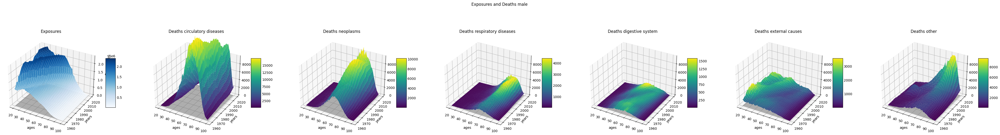

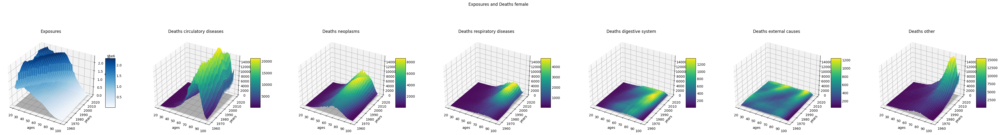

In [114]:
%matplotlib inline
%matplotlib inline
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.style.use('_mpl-gallery')
from matplotlib import cm

for idx_sex in [1, 2]:        
    # Data preparation
    Y = df_m.year.unique()
    X = data_hmd.ages
    X, Y = np.meshgrid(X, Y)
    df_d = data_hmd.to_wide(py_hmd_data.TYPE_DATA_DEATH)
    E = data_hmd.to_wide(py_hmd_data.TYPE_DATA_EXP).loc[df_e.sex == idx_sex, data_hmd.col_e].values
    zeros = np.zeros(X.shape)

    # Create a figure
    fig = plt.figure(figsize=(42, 7))
    fig.suptitle(f"Exposures and Deaths {py_params.BIDICT_SEX_1_2[idx_sex]}")

    # Plot the exposure
    ax1 = fig.add_subplot(171, projection='3d')
    surf = ax1.plot_surface(X, Y, E, vmin=E.min() * 2, cmap=cm.Blues)
    ax1.plot_surface(X, Y, zeros, color='gray', alpha=0.5, label='Separation Plane')
    ax1.set_xlabel('ages')
    ax1.set_ylabel('years')
    ax1.set_zlabel('exp')
    ax1.set_title(f'Exposures')
    fig.colorbar(surf, ax=ax1, shrink=0.3, aspect=5)

    # Plot the death for each cause
    for idx_cause in df_d.cause.unique():
        D = df_d.loc[(df_d.sex == idx_sex)&(df_d.cause == idx_cause), [f"d{age}" for age in data_hmd.ages]].values    
        if(idx_cause == 1):
            ax2 = fig.add_subplot(171+idx_cause, projection='3d')
        else:
            ax2 = fig.add_subplot(171+idx_cause, projection='3d', sharez=ax2)
        surf = ax2.plot_surface(X, Y, D, vmin=D.min() * 2, cmap='viridis')
        ax2.plot_surface(X, Y, zeros, color='gray', alpha=0.5, label='Separation Plane')
        ax2.set_xlabel('ages')
        ax2.set_ylabel('years')
        ax2.set_zlabel('death')
        ax2.set_title(f'Deaths {py_params.BIDICT_CAUSE_1_HMD[idx_cause]}')
        fig.colorbar(surf, ax=ax2, shrink=0.3, aspect=5)
        # ax.set_zlim(zlim)

    # Save the figure
    fig.savefig(f'{py_params.PATH_IMAGES}Exp and Death {py_params.BIDICT_SEX_1_2[idx_sex]}.png')
plt.show()

## Mortality Surface

### All Mortality Surface in Subplots

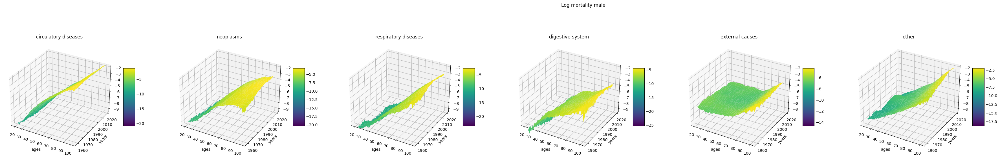

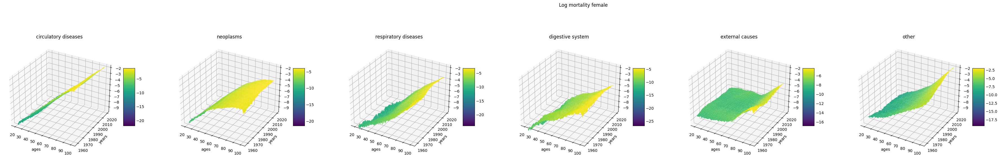

In [115]:
%matplotlib inline
%matplotlib inline
plt.style.use('_mpl-gallery')
from matplotlib import cm

for idx_sex in [1, 2]:        
    # Data preparation
    Y = df_m.year.unique()
    X = data_hmd.ages
    X, Y = np.meshgrid(X, Y)
    df_lm = data_hmd.to_wide(py_hmd_data.TYPE_DATA_LM)    
    zeros = np.zeros(X.shape)

    # Create a figure
    fig = plt.figure(figsize=(42, 7))
    # fig = plt.figure(figsize=(14, 3))
    fig.suptitle(f"Log mortality {py_params.BIDICT_SEX_1_2[idx_sex]}")

    # Plot the death for each cause
    for idx_cause in df_d.cause.unique():
        LM = df_lm.loc[(df_lm.sex == idx_sex)&(df_lm.cause == idx_cause), [f"lm{age}" for age in data_hmd.ages]].values    
        if(idx_cause == 1):
            ax = fig.add_subplot(170+idx_cause, projection='3d')
        else:
            ax = fig.add_subplot(170+idx_cause, projection='3d', sharez=ax)
        surf = ax.plot_surface(X, Y, LM, vmin=LM.min() * 2, cmap='viridis')
        ax.set_xlabel('ages')
        ax.set_ylabel('years')
        ax.set_zlabel('death')
        ax.set_title(f'{py_params.BIDICT_CAUSE_1_HMD[idx_cause]}')
        fig.colorbar(surf, ax=ax, shrink=0.3, aspect=5)
        
    # Save the figure
    fig.savefig(f'{py_params.PATH_IMAGES} Mortality {py_params.BIDICT_SEX_1_2[idx_sex]}.png')
plt.show()

### Interactive Mortality Surfaces for each sex (Color-coded by intensity)
The color is based on the intensity of log-mortality values

In [116]:
LM.shape

(61, 81)

In [117]:
%matplotlib inline
# %matplotlib widget

# Prepare control for the plots
# Prepare the checkboxes
check1 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[1])
check2 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[2])
check3 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[3])
check4 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[4])
check5 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[5])
check6 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[6])
ui = widgets.HBox([check1, check2, check3, check4, check5, check6])

def surface_cause(cause1, cause2, cause3,
                  cause4, cause5, cause6):
    # Data preparation
    Y = df_m.year.unique()
    X = data_hmd.ages
    X, Y = np.meshgrid(X, Y)    

    # Prepare the data
    df_lm = data_hmd.to_wide(py_hmd_data.TYPE_DATA_LM)

    # Prepare control for coloring the plot
    z_min = df_lm.loc[:,[f"lm{age}" for age in data_hmd.ages]].values.min()
    z_max = df_lm.loc[:,[f"lm{age}" for age in data_hmd.ages]].values.max()
    norm=plt.Normalize(z_min,z_max)
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
    sm.set_array([])

    # Create a figure    
    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(8, 4), subplot_kw={"projection": "3d"})    
    fig.suptitle(f"Mortality Surface")
    
    # Prepare filter
    causes = [cause1, cause2, cause3, cause4, cause5, cause6]    

    # Plot separate surfaces for each selected cause
    for idx_cause, is_cause in enumerate(causes, start=1):        
        if(is_cause):
            # Filter the data
            LM = df_lm.loc[(df_lm.sex == 1)&(df_lm.cause == idx_cause), 
                        [f"lm{age}" for age in data_hmd.ages]].values    
            
            # Plot the surface
            axs[0].plot_surface(X, Y, LM, cmap='viridis', norm=norm);
            axs[0].set_zlim(z_min, z_max) 

            # Filter the data
            LM = df_lm.loc[(df_lm.sex == 2)&(df_lm.cause == idx_cause), 
                        [f"lm{age}" for age in data_hmd.ages]].values    
            
            # Plot the surface
            axs[1].plot_surface(X, Y, LM, cmap='viridis', norm=norm);
            axs[1].set_zlim(z_min, z_max) 

    axs[0].set_title(f"{py_params.BIDICT_SEX_1_2[1]}")
    axs[0].set_xlabel('ages')
    axs[0].set_ylabel('years')
    axs[0].set_zlabel('log_mortality')
    axs[1].set_title(f"{py_params.BIDICT_SEX_1_2[2]}")
    axs[1].set_xlabel('ages')
    axs[1].set_ylabel('years')
    axs[1].set_zlabel('log_mortality')
    cbar = axs[1].figure.colorbar(sm, ax=axs[1], shrink=0.5)
    cbar.set_label('log_mortality', rotation=90)
    plt.show();
    
out = widgets.interactive_output(surface_cause, {"cause1": check1, "cause2": check2, "cause3": check3,
                                                 "cause4": check4, "cause5": check5, "cause6": check6})
display(ui, out)

Output()

### Interactive Mortality Surfaces for each sex (Color-coded by cause)
The color is based on the cause

In [118]:
%matplotlib inline
# %matplotlib widget
plt.ion()

check1 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[1])
check2 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[2])
check3 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[3])
check4 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[4])
check5 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[5])
check6 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[6])
ui = widgets.HBox([check1, check2, check3, check4, check5, check6])

cs = [(1, 0.5, 0, 1), 
      (0.5, 0, 1, 1), 
      (0.5, 1, 0, 1), 
      (1, 0.25, 0.25, 1), 
      (0.1, 0.0, 1, 1), 
      (0.25, 0.85, 0.85, 1), ]
def surface_cause(cause1, cause2, cause3,
                  cause4, cause5, cause6):
    # Data preparation
    Y = df_m.year.unique()
    X = data_hmd.ages
    X, Y = np.meshgrid(X, Y)
        
    # Prepare the data
    df_lm = data_hmd.to_wide(py_hmd_data.TYPE_DATA_LM)

    # Prepare control for coloring the plot
    z_min = df_lm.loc[:,[f"lm{age}" for age in data_hmd.ages]].values.min()
    z_max = df_lm.loc[:,[f"lm{age}" for age in data_hmd.ages]].values.max()    

    # Create a figure    
    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(8, 4), subplot_kw={"projection": "3d"})
    fig.suptitle(f"Mortality Surface")

    # Prepare control for the plot
    causes = [cause1, cause2, cause3, cause4, cause5, cause6]
    
    # Plot separate surfaces for each selected cause
    for idx_cause, is_cause in enumerate(causes, start=1):        
        if(is_cause):        
            # Filter the data
            LM = df_lm.loc[(df_lm.sex == 1)&(df_lm.cause == idx_cause), 
                        [f"lm{age}" for age in data_hmd.ages]].values    
            
            # Plot the surface
            axs[0].plot_surface(X, Y, LM, color=cs[idx_cause-1]);
            axs[0].set_zlim(z_min, z_max) 

            # Filter the data
            LM = df_lm.loc[(df_lm.sex == 2)&(df_lm.cause == idx_cause), 
                        [f"lm{age}" for age in data_hmd.ages]].values    
            
            # Plot the surface
            axs[1].plot_surface(X, Y, LM, color=cs[idx_cause-1], label = py_params.BIDICT_CAUSE_1_HMD[idx_cause]);            
            axs[1].set_zlim(z_min, z_max) 

    axs[0].set_title(f"{py_params.BIDICT_SEX_1_2[1]}")
    axs[0].set_xlabel('ages')
    axs[0].set_ylabel('years')
    axs[0].set_zlabel('log_mortality')
    axs[1].set_title(f"{py_params.BIDICT_SEX_1_2[2]}")
    axs[1].set_xlabel('ages')
    axs[1].set_ylabel('years')
    axs[1].set_zlabel('log_mortality')

    fig.legend()
    plt.show();
    
out = widgets.interactive_output(surface_cause, {"cause1": check1, "cause2": check2, "cause3": check3,
                                                 "cause4": check4, "cause5": check5, "cause6": check6})
display(ui, out)

Output()

## Histogram of log mortality (Global)

First let's see a global view of the log mortality distribution for all ages and years

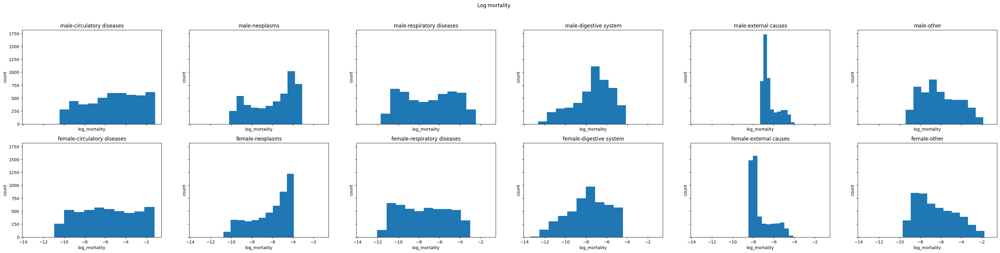

In [119]:
# import sys
# from importlib import reload

# # sys.modules.pop('matplotlib')
# import seaborn as sns
# import matplotlib.pyplot as plt
# import matplotlib
# from mpl_toolkits.mplot3d import Axes3D
# import ipywidgets as widgets
# from ipywidgets import interact  
# from IPython.display import display
# reload(plt)

# %matplotlib inline
%matplotlib inline
# from importlib import reload
# reload(plt)
# reload(matplotlib)
# reload(sns)

# Plotting a basic histogram
idx_country = "USA"
sexes = [1, 2]
causes = df_lm.cause.unique()

# Create a figure with subplots
fig, axs = plt.subplots(figsize = (42,9), nrows=len(sexes), ncols=len(causes), 
                        sharex=True, sharey=True)
fig.suptitle(f"Log mortality")

# for each sex
for idx_sex in sexes:
    # for each cause
    for idx_cause in causes:
        # Filter the data
        df_curr = df_lm.loc[(df_lm.sex == idx_sex) & (df_lm.cause == idx_cause),[f"lm{age}" for age in data_hmd.ages]]

        # Create a subplot        
        ax_curr = axs[idx_sex-1, idx_cause-1]
        ax_curr.hist(df_curr.values.flatten())

        ax_curr.set_xlabel('log_mortality')
        ax_curr.set_ylabel('count')
        ax_curr.set_title(f'{py_params.BIDICT_SEX_1_2[idx_sex]}-{py_params.BIDICT_CAUSE_1_HMD[idx_cause]}')

plt.show();

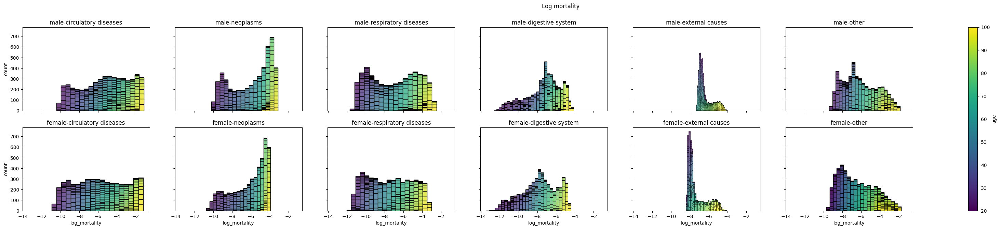

In [120]:
%matplotlib inline

# Plotting a basic histogram
idx_country = "USA"
sexes = [1, 2]
causes = df_lm.cause.unique()

# Create a figure with subplots
fig, axs = plt.subplots(figsize = (42,7), nrows=len(sexes), ncols=len(causes), 
                        sharex=True, sharey=True)
fig.suptitle(f"Log mortality")

# Specify the color pattern (seaborn specific)
col_palette = sns.color_palette("viridis", len(data_hmd.ages))   
df_lm_long = data_hmd.to_long(py_hmd_data.TYPE_DATA_LM)

# for each sex
for idx_sex in sexes:
    # for each cause
    for idx_cause in causes:
        # Filter the data        
        df_curr = df_lm_long.loc[(df_lm_long.sex == idx_sex) & 
                                 (df_lm_long.cause == idx_cause)]        
        
        # Create a subplot        
        ax_curr = axs[idx_sex-1, idx_cause-1]
        sns.histplot(df_curr, ax=ax_curr, x="log_mortality", hue='age', multiple='stack', palette=col_palette, legend=False)        
        
        ax_curr.set_xlabel('log_mortality')
        ax_curr.set_ylabel('count')
        ax_curr.set_title(f'{py_params.BIDICT_SEX_1_2[idx_sex]}-{py_params.BIDICT_CAUSE_1_HMD[idx_cause]}')

#discrete color scheme
norm = plt.Normalize(min(data_hmd.ages), max(data_hmd.ages))
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax_curr = sns.histplot(data=df_curr, x="log_mortality", hue='age', multiple='stack',palette='viridis')
ax_curr.get_legend().remove()
cbar = ax_curr.figure.colorbar(sm, ax=axs[:,:])
cbar.set_label('age', rotation=90)

# legend_ax.figure.colorbar(sm, ax=legend_ax, shrink=0.6, fraction=0.1)
# ax = sns.histplot(data=df_curr, x="log_mortality", hue='age', multiple='stack',palette='viridis')
# ax.get_legend().remove()
# cbar = ax.figure.colorbar(sm, ax=axs[:,:])
# cbar.set_label('age', rotation=90)
plt.show();

Compare the histogram with the ones after scaled with MinMaxScaler

## Multiple Histogram for each year

In [121]:
%matplotlib inline
# %matplotlib widget
# %matplotlib widget

cmap = matplotlib.cm.get_cmap('Spectral')
idx_sex = 1
idx_cause = 1
nbins = 10
year_test = list(range(YEAR_END+1, max(data_hmd.years)))

# for each year
@interact(sex = list(py_params.BIDICT_SEX_1_2.values())[0:2], cause=list(py_params.BIDICT_CAUSE_1_HMD.values())[1:])
def f(sex, cause):
    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=(8,6), subplot_kw={"projection": "3d"})
    fig.suptitle(f'{sex}-{cause} (all ages)')

    cause = py_params.BIDICT_CAUSE_1_HMD.inverse[cause]
    sex = py_params.BIDICT_SEX_1_2.inverse[sex]
    for idx_color, idx_year in zip(range(1, len(year_test)), year_test):
        data = df_lm.loc[(df_lm.sex == sex) & 
                        (df_lm.cause == cause) & 
                        (df_lm.year == idx_year),[f'lm{age}' for age in data_hmd.ages]].values.flatten()

        hist, bins = np.histogram(data, bins=nbins)
        xs = (bins[:-1] + bins[1:])/2

        c = cmap(idx_color/len(year_test))
        ax.bar(xs, hist, zs=idx_year, zdir='y', color=c, ec=c, alpha=0.8)

    ax.set_xlabel('log mortality')
    ax.set_ylabel('year')
    ax.set_zlabel('count')
    plt.show()

C:\Users\dkrisnad\AppData\Local\Temp\ipykernel_13036\857896027.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('Spectral')


interactive(children=(Dropdown(description='sex', options=('male', 'female'), value='male'), Dropdown(descript…

## Wireframe (Surface Without Interpolation)

In [122]:
%matplotlib inline
# Prepare control for the plots
# Prepare the checkboxes
check1 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[1])
check2 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[2])
check3 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[3])
check4 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[4])
check5 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[5])
check6 = widgets.Checkbox(True, description=py_params.BIDICT_CAUSE_1_HMD[6])
ui = widgets.HBox([check1, check2, check3, check4, check5, check6])
     
cs = [(1, 0.5, 0, 1), 
      (0.5, 0, 1, 1), 
      (0.5, 1, 0, 1), 
      (1, 0.25, 0.25, 1), 
      (0.1, 0.0, 1, 1), 
      (0.25, 0.85, 0.85, 1), ]          

def surface_cause(cause1, cause2, cause3,
                  cause4, cause5, cause6):
    # Data preparation
    Y = df_m.year.unique()
    X = data_hmd.ages
    X, Y = np.meshgrid(X, Y)
    
    # Prepare the data
    df_lm = data_hmd.to_wide(py_hmd_data.TYPE_DATA_LM)

    # Prepare control for coloring the plot
    z_min = df_lm.loc[:,[f"lm{age}" for age in data_hmd.ages]].values.min()
    z_max = df_lm.loc[:,[f"lm{age}" for age in data_hmd.ages]].values.max()
    norm=plt.Normalize(z_min,z_max)
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
    sm.set_array([])

    # Create a figure        
    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(8, 4), subplot_kw={"projection": "3d"})
    fig.suptitle(f"Mortality Surface")
    
    # Prepare filter
    causes = [cause1, cause2, cause3, cause4, cause5, cause6]    

    # Plot separate surfaces for each selected cause
    for idx_cause, is_cause in enumerate(causes, start=1):        
        if(is_cause):
            # Filter the data
            LM = df_lm.loc[(df_lm.sex == 1)&(df_lm.cause == idx_cause), 
                        [f"lm{age}" for age in data_hmd.ages]].values    
            
            # Plot the surface
            axs[0].plot_wireframe(X, Y, LM, cstride=0, rstride=10, color=cs[idx_cause-1], label = py_params.BIDICT_CAUSE_1_HMD[idx_cause]);
            axs[0].set_zlim(z_min, z_max) 

            # Filter the data
            LM = df_lm.loc[(df_lm.sex == 2)&(df_lm.cause == idx_cause), 
                        [f"lm{age}" for age in data_hmd.ages]].values    
            
            # Plot the surface
            axs[1].plot_wireframe(X, Y, LM,  cstride=10, rstride=0, color=cs[idx_cause-1]);
            axs[1].set_zlim(z_min, z_max) 
            axs[1].view_init(azim=160, elev=10)

    axs[0].set_title(f"{py_params.BIDICT_SEX_1_2[1]}")
    axs[0].set_xlabel('ages')
    axs[0].set_ylabel('years')
    axs[0].set_zlabel('log_mortality')
    axs[1].set_title(f"{py_params.BIDICT_SEX_1_2[2]}")
    axs[1].set_xlabel('ages')
    axs[1].set_ylabel('years')
    axs[1].set_zlabel('log_mortality')    
    fig.legend()
    plt.show();


out = widgets.interactive_output(surface_cause, {"cause1": check1, "cause2": check2, "cause3": check3,
                                                 "cause4": check4, "cause5": check5, "cause6": check6})
display(ui, out)

Output()

## Line Plot (Time Series Plot)

### Year vs Log Mortality

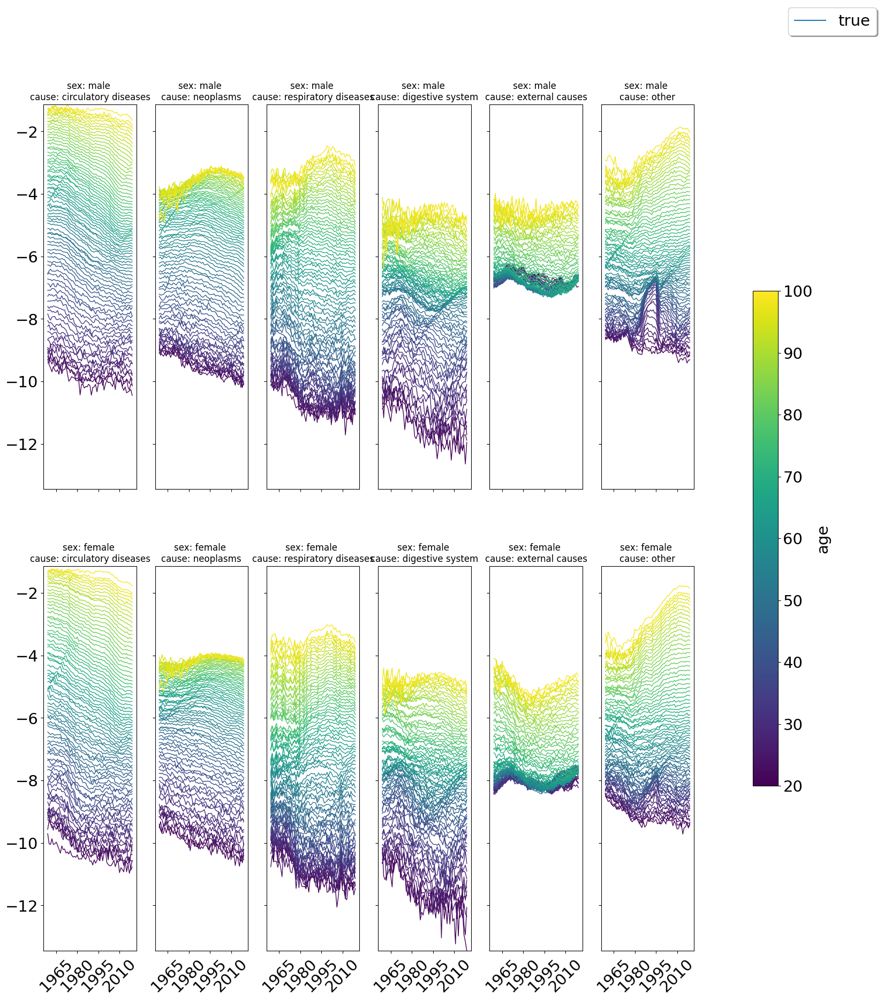

In [123]:
%matplotlib inline
%matplotlib inline

df_lm_long = data_hmd.to_long(data_type=py_hmd_data.TYPE_DATA_LM)
y_min = df_lm_long['log_mortality'].min()
y_max = df_lm_long['log_mortality'].max()
df_lm_long['type'] = py_params.TYPE_TRUE

# matplotlib.rcParams.update(matplotlib.rcParamsDefault)

py_utils.plot_year_value(df_final_long=df_lm_long,
                    value='log_mortality',
                    row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                    col_feature_name='cause', col_feature_values=list(df_lm_long['cause'].unique()),
                            col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                    hue_feature_name='age', hue_feature_values=df_lm_long.age.unique(),
                    types=[py_params.TYPE_TRUE], 
                    years=data_hmd.years,
                    year_separators=None,
                    title_fig="",
                    is_fig_saved = False,
                    y_limit = [y_min, y_max])

### Age vs Log Mortality

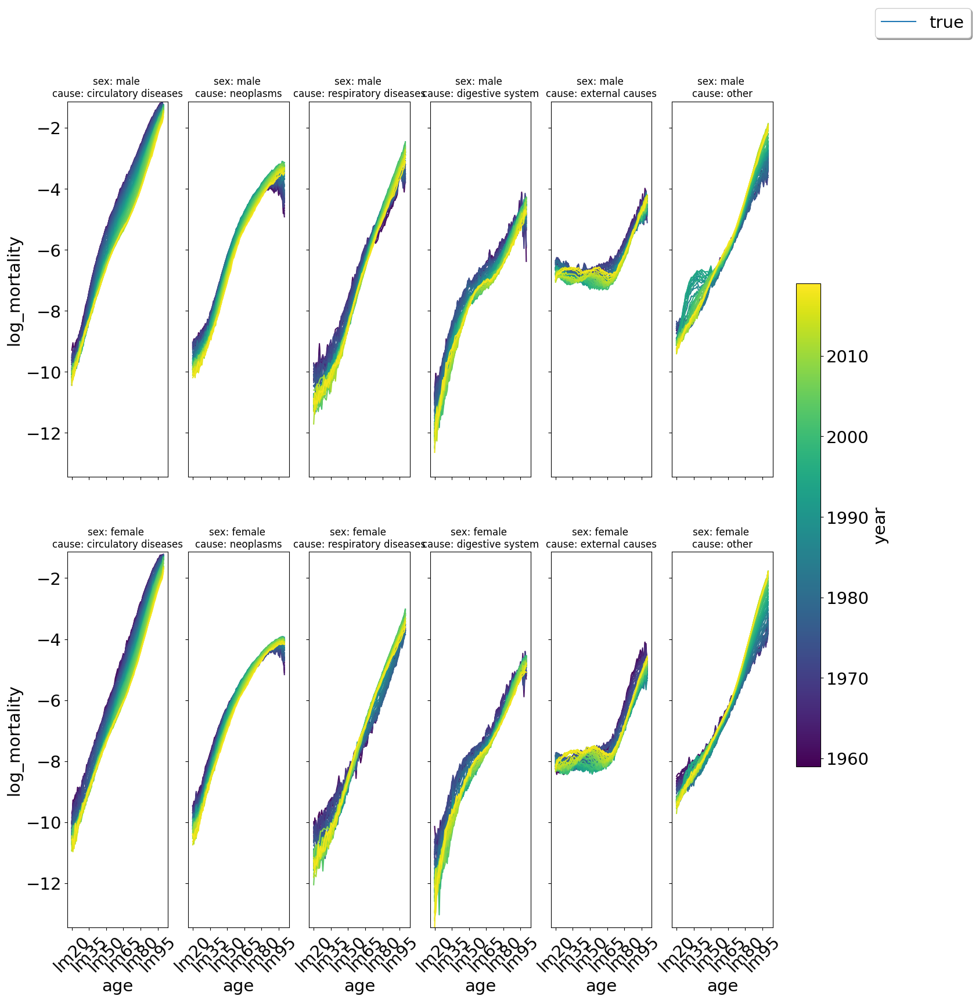

In [124]:
py_utils.plot_age_mortality_year(df_lm_long, 
                            row_feature_name='sex', row_feature_values=[1,2], 
                            row_labels=py_params.BIDICT_SEX_1_2,
                            col_feature_name='cause', col_feature_values=list(df_lm_long['cause'].unique()),
                            col_labels=dict(py_params.BIDICT_CAUSE_1_HMD),
                            hue_feature_name='year',
                            hue_feature_values=data_hmd.years,                            
                            types=[py_params.TYPE_TRUE], 
                            title_fig = "",
                            is_fig_saved=False,
                            ages=list(df_lm_long['age'].unique()), y_limit=[y_min, y_max])

# Stochastic Modeling (LC Model)

## Build The Model

In [125]:
# Make a dataframe 
c = None
df_models_lc = None
df_models_rh = None
df_pred_lc_rwd = None
df_pred_lc_auto = None

# specify all the sexes and causes
sexes = df_m['sex'].unique()
causes = df_m['cause'].unique()
# causes = [1, 2, 3]

# specify the country
idx_country = 'USA'
# for each gender
for idx_sex in sexes:
    # for each cause
    for idx_cause in causes:
        
        # extract the mortality rates and exposures
        mxt, years, ages = data_hmd.get_mxt(year_start=YEAR_START, year_end=YEAR_END, age_start=AGE_START, age_end=AGE_END,
                       sex=idx_sex, cause=idx_cause, country=idx_country)
        ext, _, _ = data_hmd.get_ext(year_start=YEAR_START, year_end=YEAR_END, age_start=AGE_START, age_end=AGE_END,
                       sex=idx_sex, country=idx_country)
        
        ####################
        # build the LC model
        ####################
        print(f"=======================================================")
        print(f"Building an LC model (sex:{idx_sex}, cause:{idx_cause})")
        model_lc = Lc()
        model_lc.fit(mxt, ext, year_start=years[0], year_end=years[-1])
                                
        # get the predictions for fitted data
        kt_hat, idx_fitted, mxt_hat_fitted, res_fitted = model_lc.predict(horizon=0)

        # get the predictions for test data
        mxt_test, _, _ = data_hmd.get_mxt(year_start=YEAR_END+1, year_end=data_hmd.years[-1], 
                                    age_start=AGE_START, age_end=AGE_END,
                                    sex=idx_sex, cause=idx_cause, country=idx_country)
        
        kt_hat_test_rwd, idx_test, mxt_hat_test_rwd, res_test_rwd = model_lc.predict(horizon=len([year for year in data_hmd.years if year > YEAR_END]), 
                                                                                     order=(0,1,0),
                                                                                     mxt_true=mxt_test)
        kt_hat_test_auto, idx_test, mxt_hat_test_auto, res_test_auto = model_lc.predict(horizon=len([year for year in data_hmd.years if year > YEAR_END]), 
                                                                                        order=None,
                                                                                        mxt_true=mxt_test)
                
        # put all the predictions together into a dataframe
        # put the predictions from LC with random walk 
        df_curr_lc_rwd = pd.DataFrame(np.append(mxt_hat_fitted, mxt_hat_test_rwd, axis=1).T, columns=features_m)
        df_curr_lc_rwd.insert(0, 'cause', idx_cause)
        df_curr_lc_rwd.insert(0, 'sex', idx_sex)
        df_curr_lc_rwd.insert(0, 'year', np.append(idx_fitted, idx_test))
        df_curr_lc_rwd.insert(0, 'country', idx_country)
        if df_pred_lc_rwd is None:
            df_pred_lc_rwd = df_curr_lc_rwd.copy()
        else:
            df_pred_lc_rwd = pd.concat([df_pred_lc_rwd, df_curr_lc_rwd], ignore_index=True)
        # put the predictions from LC with auto ARIMA
        df_curr_lc_auto = pd.DataFrame(np.append(mxt_hat_fitted, mxt_hat_test_auto, axis=1).T, columns=features_m)
        df_curr_lc_auto.insert(0, 'cause', idx_cause)
        df_curr_lc_auto.insert(0, 'sex', idx_sex)
        df_curr_lc_auto.insert(0, 'year', np.append(idx_fitted, idx_test))
        df_curr_lc_auto.insert(0, 'country', idx_country)
        if df_pred_lc_auto is None:
            df_pred_lc_auto = df_curr_lc_auto.copy()
        else:
            df_pred_lc_auto = pd.concat([df_pred_lc_auto, df_curr_lc_auto], ignore_index=True)

        # store the model in a dataframe
        df_curr_model_lc = pd.DataFrame({'sex': [idx_sex], 'cause': [idx_cause], 'model': [model_lc], 
                                         'kt_hat_test_rwd': [kt_hat_test_rwd],
                                         'order_auto': [model_lc.order], 'kt_hat_test_auto': [kt_hat_test_auto]})
        if df_models_lc is None:
            df_models_lc = df_curr_model_lc.copy()
        else:
            df_models_lc = pd.concat([df_models_lc, df_curr_model_lc], ignore_index=True)

        ####################################
        # build the LC model (FOR ALL YEARS)
        ####################################
        # extract the mortality rates and exposures
        mxt, years, ages = data_hmd.get_mxt(year_start=YEAR_START, year_end=max(data_hmd.years), age_start=AGE_START, age_end=AGE_END,
                       sex=idx_sex, cause=idx_cause, country=idx_country)
        ext, _, _ = data_hmd.get_ext(year_start=YEAR_START, year_end=max(data_hmd.years), age_start=AGE_START, age_end=AGE_END,
                       sex=idx_sex, country=idx_country)
        # build the LC model
        model_lc = Lc()
        model_lc.fit(mxt, ext, year_start=years[0], year_end=years[-1])
        # get the predictions for fitted data
        kt_hat, idx_fitted, mxt_hat_fitted, res_fitted = model_lc.predict(horizon=0)
        df_models_lc.loc[(df_models_lc.sex==idx_sex) & (df_models_lc.cause == idx_cause), 'model_complete'] = model_lc


Building an LC model (sex:1, cause:1)
Performing stepwise search to minimize aic
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=151.418, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=136.361, Time=0.01 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=127.528, Time=0.03 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=149.540, Time=0.01 sec
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=128.072, Time=0.02 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=127.994, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=129.962, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=127.461, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=127.589, Time=0.01 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=127.241, Time=0.02 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=129.241, Time=0.03 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=129.240, Time=0.03 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,2,2)(0,0,0)[0]          
Total fit time: 0.388 seconds
B

### Plots of all the parameters of the LC model

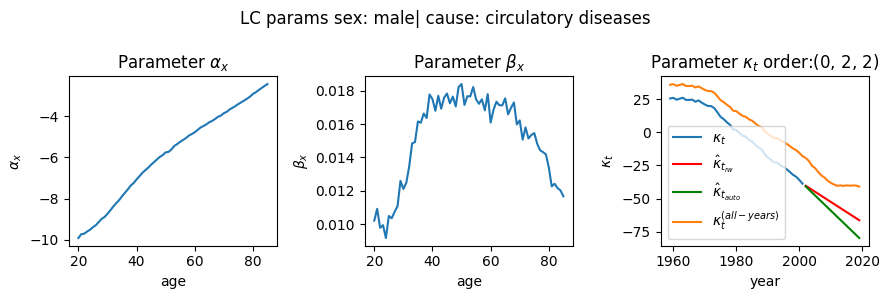

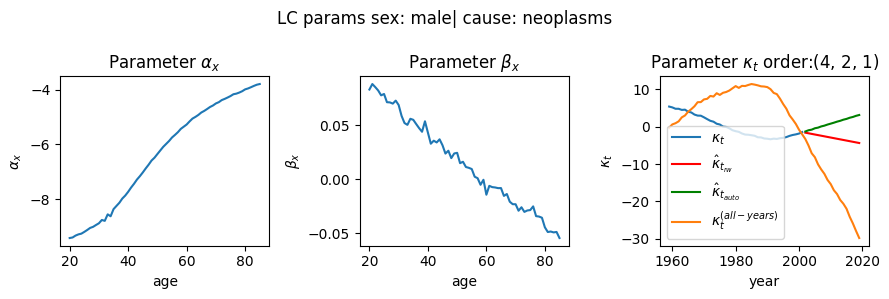

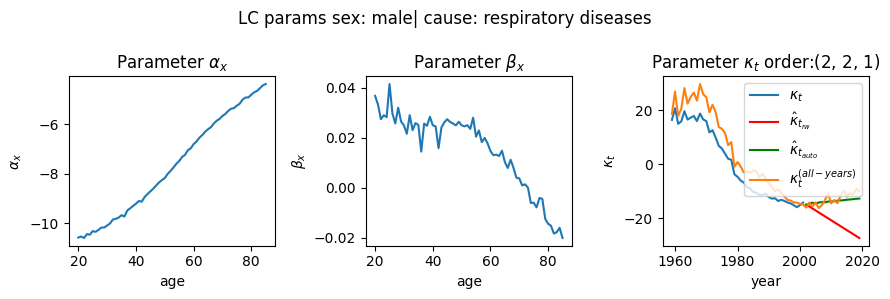

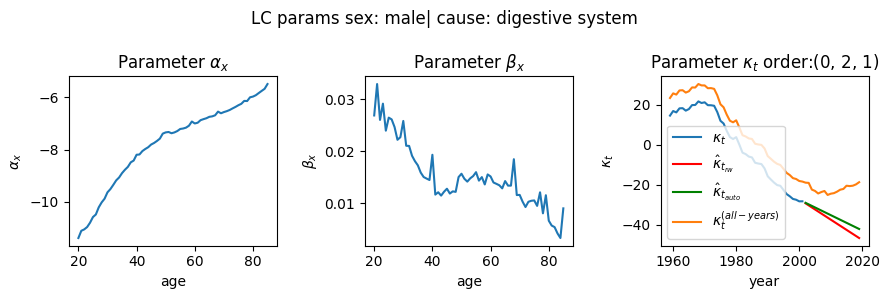

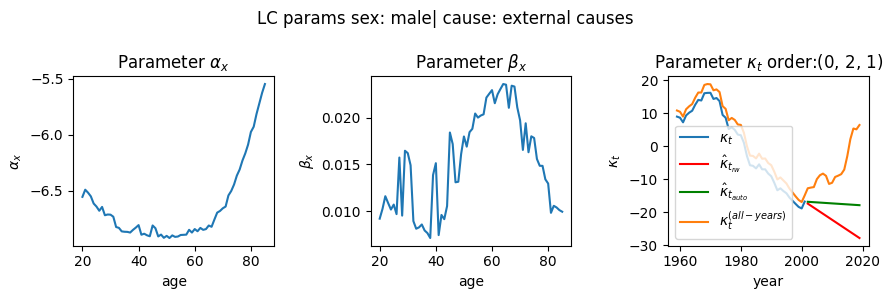

...

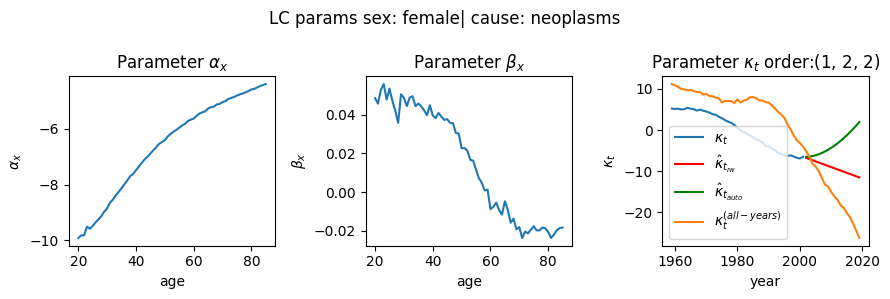

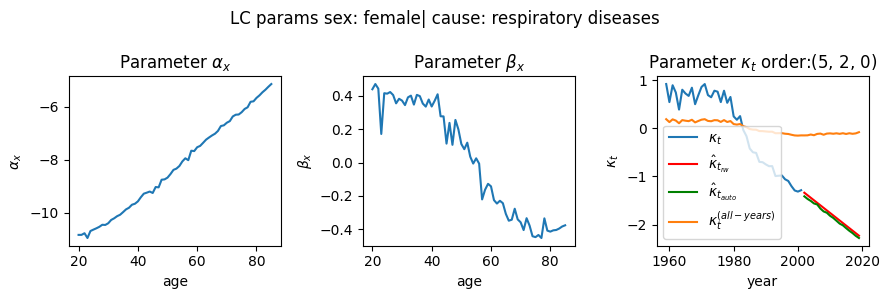

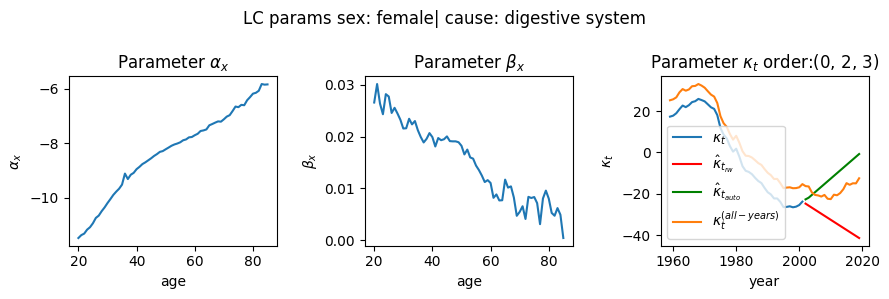

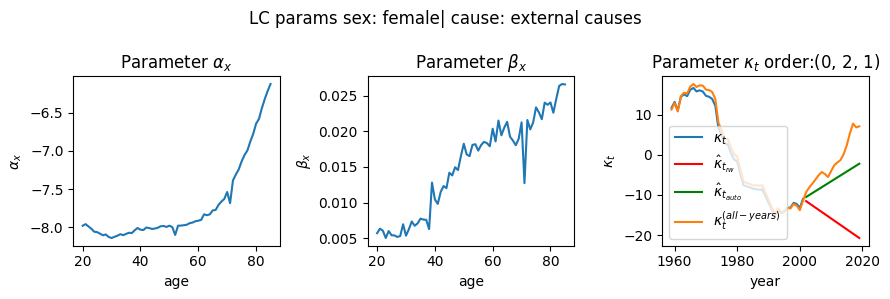

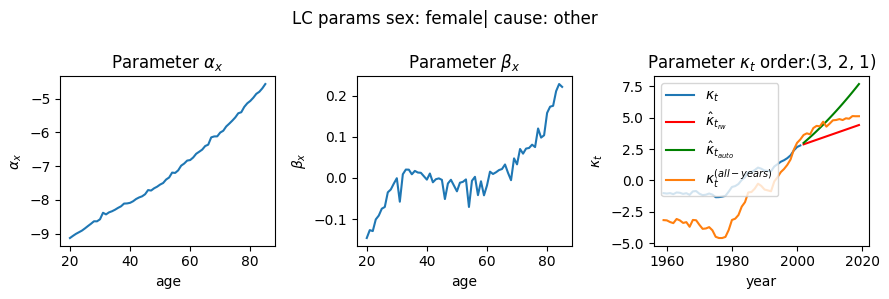

In [126]:
%matplotlib inline
%matplotlib inline
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
for i in range(0, df_models_lc.shape[0]):
    # Create data for the line plots
    x_age = np.arange(AGE_START, AGE_END+1)
    x_year = data_hmd.years

    # Create a figure and three subplots
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(f'LC params sex: {py_params.BIDICT_SEX_1_2[df_models_lc.sex[i]]}| cause: {py_params.BIDICT_CAUSE_1_HMD[df_models_lc.cause[i]]}')

    # Plot the first line
    ax1.plot(x_age, df_models_lc.model[i].params['ax'], label=r'$\alpha_x$')
    ax1.set_title(r'Parameter $\alpha_x$')
    ax1.set_xlabel('age')
    ax1.set_ylabel(r'$\alpha_x$')
    
    # Plot the second line
    ax2.plot(x_age, df_models_lc.model[i].params['bx'], label=r'$\beta_x$')
    ax2.set_title(r'Parameter $\beta_x$')
    ax2.set_xlabel('age')
    ax2.set_ylabel(r'$\beta_x$')
    
    # Plot the third line
    ax3.plot(x_year[0:len(df_models_lc.model[i].params['kt'])], df_models_lc.model[i].params['kt'], label=r"$\kappa_t$")    
    ax3.plot(x_year[len(df_models_lc.model[i].params['kt']):], df_models_lc.kt_hat_test_rwd[i], 'r-', label=r"$\hat{\kappa}_{t_{rw}}$")
    ax3.plot(x_year[len(df_models_lc.model[i].params['kt']):], df_models_lc.kt_hat_test_auto[i], 'g-', label=r"$\hat{\kappa}_{t_{auto}}$")
    ax3.plot(x_year[0:len(df_models_lc.model_complete[i].params['kt'])], df_models_lc.model_complete[i].params['kt'], label=r"$\kappa_t^{(all-years)}$")    
    ax3.set_title(r'Parameter $\kappa_t$ order:' + f'{df_models_lc.order_auto[i]}')
    ax3.set_xlabel('year')
    ax3.set_ylabel(r'$\kappa_t$')
    ax3.legend()

    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()

    # Save the figure to a file
    fig.savefig(f'{py_params.PATH_IMAGES}LC params sex-{df_models_lc.sex[i]} cause-{df_models_lc.cause[i]}.png')

## Analyze The Forecasts (Visualization)

First get the true data

In [127]:
df_lm_long = data_hmd.to_long(py_hmd_data.TYPE_DATA_LM, start_age=AGE_START, end_age=AGE_END)
df_lm_long[py_params.COL_TYPE] = py_params.TYPE_TRUE
df_lm_long.head(2)

,country,sex,cause,year,age,log_mortality,type
0,USA,1,1,1959,lm20,-9.296253,true
1,USA,1,2,1959,lm20,-9.102096,true


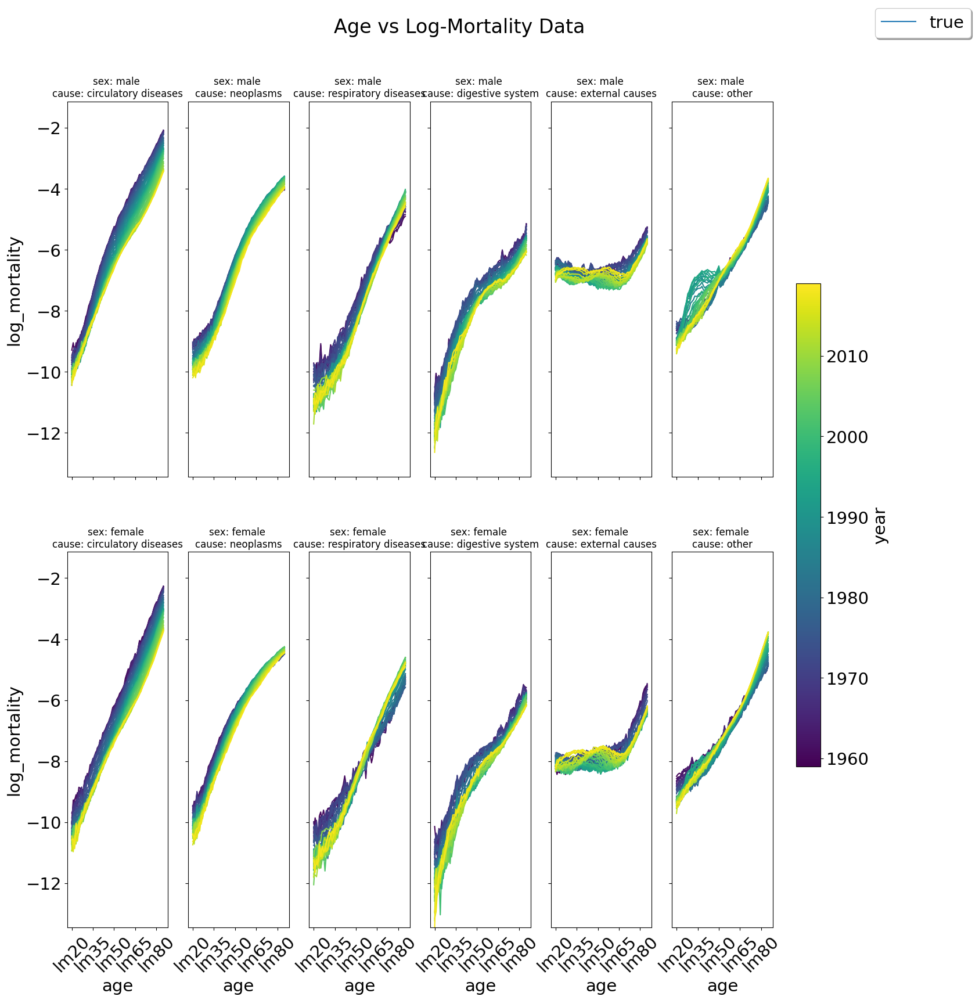

In [128]:
py_utils.plot_age_mortality_year(df_lm_long,
                            row_feature_name='sex', row_feature_values=[1,2], 
                            row_labels=py_params.BIDICT_SEX_1_2,
                            col_feature_name='cause', 
                            col_feature_values=df_lm_long['cause'].unique(),
                            col_labels=dict(py_params.BIDICT_CAUSE_1_HMD),
                            hue_feature_name='year',                            
                            hue_feature_values=df_lm_long.year.unique(),
                            types=[py_params.TYPE_TRUE],
                            title_fig = "Age vs Log-Mortality Data",
                            is_fig_saved=False,
                            ages=list(df_lm_long['age'].unique()), y_limit=[y_min, y_max])

### Random Walk

#### Overall Plot

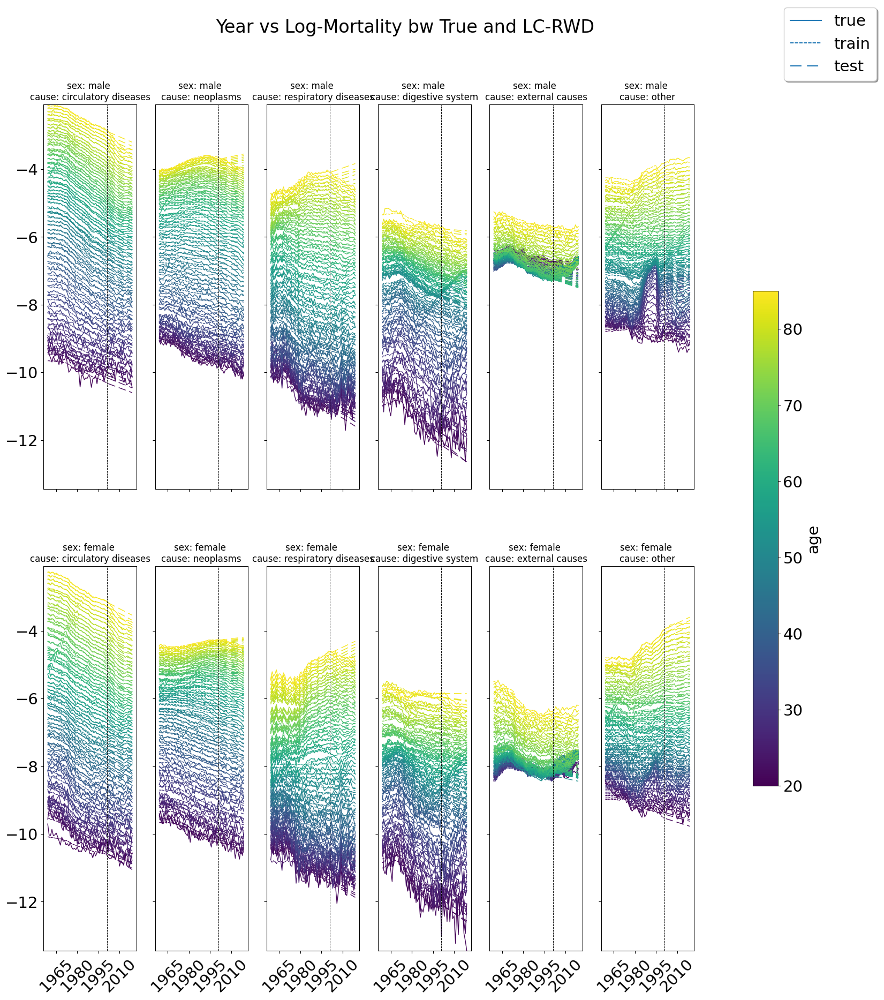

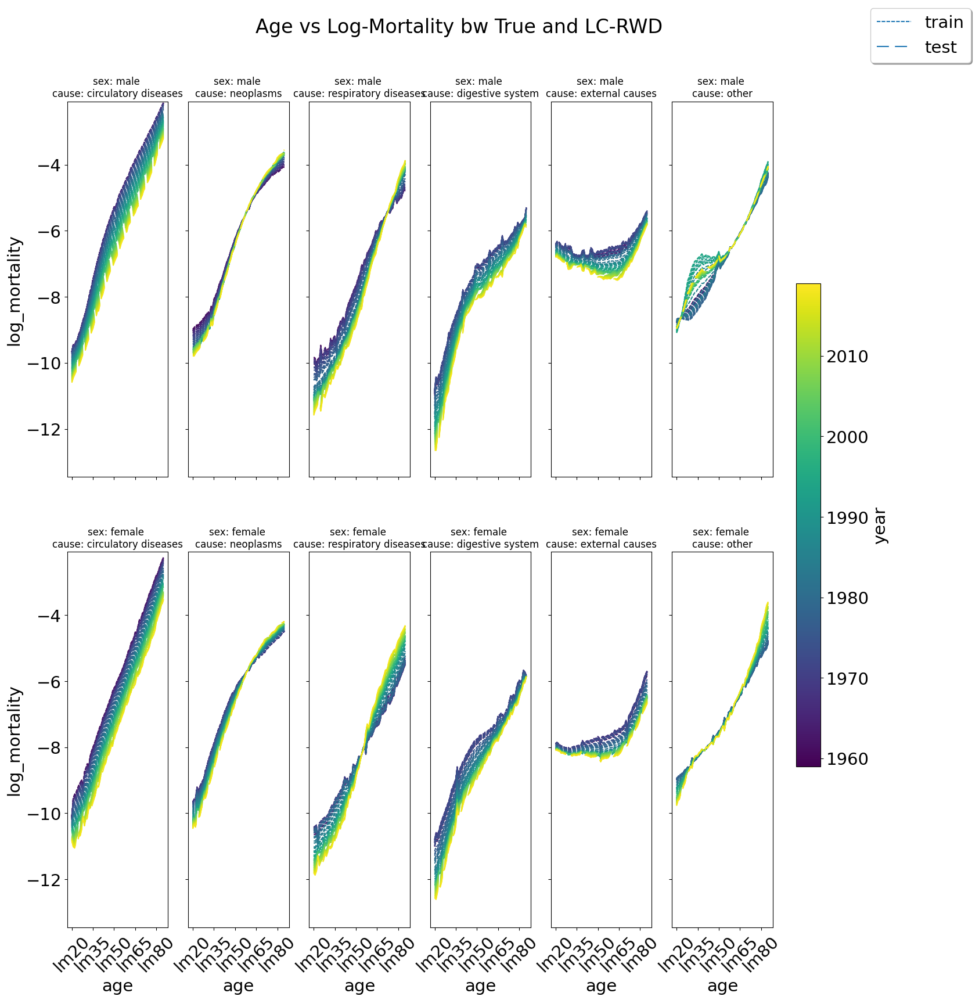

In [129]:
%matplotlib inline
data_hmd_hat_st_rwd = HmdMortalityData(df_pred_lc_rwd, df_e)  
df_pred_lc_rwd_long = data_hmd_hat_st_rwd.to_long(py_hmd_data.TYPE_DATA_LM)
df_pred_lc_rwd_long[py_params.COL_TYPE] = py_params.TYPE_TRAIN
df_pred_lc_rwd_long.loc[(df_pred_lc_rwd_long.year > YEAR_END), py_params.COL_TYPE] = py_params.TYPE_TEST

df_all_lc_rwd_long = pd.concat((df_lm_long, df_pred_lc_rwd_long), ignore_index=True)

y_min = df_all_lc_rwd_long['log_mortality'].min()
y_max = df_all_lc_rwd_long['log_mortality'].max()

py_utils.plot_year_value(df_final_long=df_all_lc_rwd_long,
                         value='log_mortality',
                         row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                         col_feature_name='cause', col_feature_values=list(df_all_lc_rwd_long['cause'].unique()),
                         col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                         hue_feature_name='age', hue_feature_values=df_all_lc_rwd_long.age.unique(),
                         types=df_all_lc_rwd_long.type.unique(), 
                         years=data_hmd.years,
                         year_separators=[YEAR_END],
                         title_fig="Year vs Log-Mortality bw True and LC-RWD",
                         is_fig_saved = False,
                         y_limit = [y_min, y_max])

predictions_types = [each_type for each_type in df_all_lc_rwd_long.type.unique() if each_type != py_params.TYPE_TRUE]
py_utils.plot_age_mortality_year(df_all_lc_rwd_long,
                            row_feature_name='sex', row_feature_values=[1,2], 
                            row_labels=py_params.BIDICT_SEX_1_2,
                            col_feature_name='cause', 
                            col_feature_values=df_all_lc_rwd_long['cause'].unique(),
                            col_labels=dict(py_params.BIDICT_CAUSE_1_HMD),
                            hue_feature_name='year',                            
                            hue_feature_values=df_all_lc_rwd_long.year.unique(),
                            types=predictions_types,
                            title_fig = "Age vs Log-Mortality bw True and LC-RWD",
                            is_fig_saved=False,
                            ages=list(df_all_lc_rwd_long['age'].unique()), y_limit=[y_min, y_max])

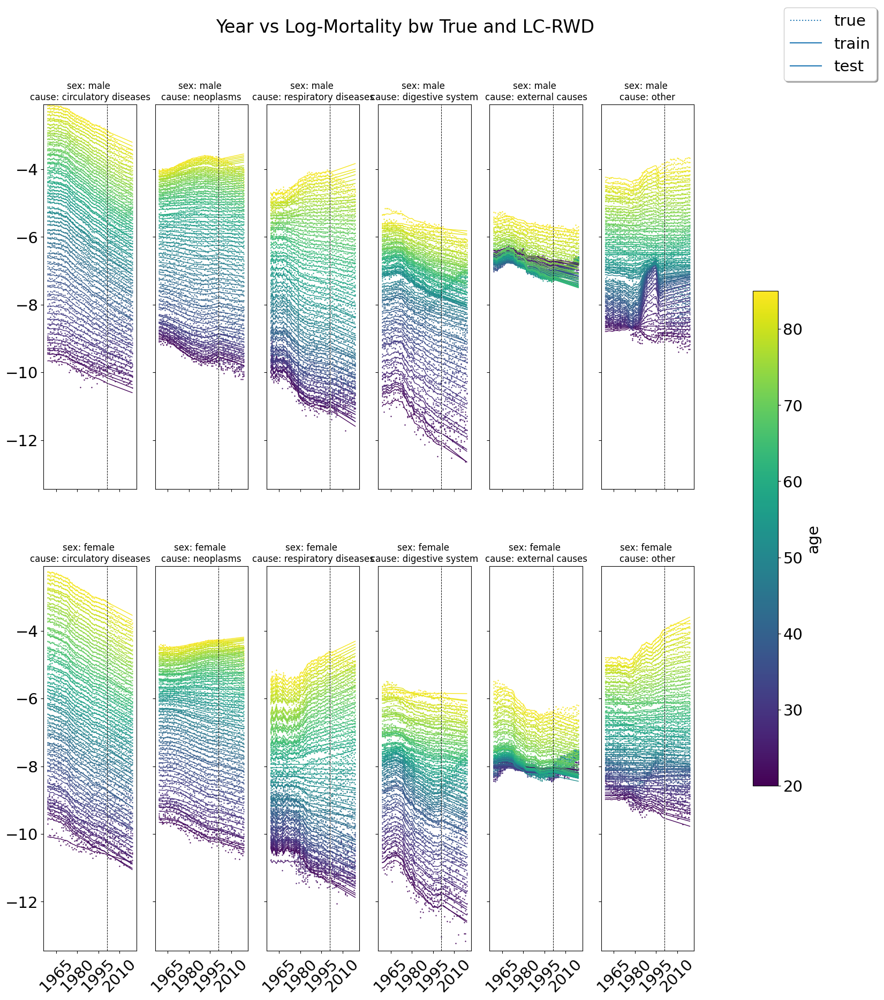

In [130]:
py_utils.plot_year_value(df_final_long=df_all_lc_rwd_long,
                         value='log_mortality',
                         row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                         col_feature_name='cause', col_feature_values=list(df_all_lc_rwd_long['cause'].unique()),
                         col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                         hue_feature_name='age', hue_feature_values=df_all_lc_rwd_long.age.unique(),
                         types=df_all_lc_rwd_long.type.unique(), 
                         years=data_hmd.years,
                         year_separators=[YEAR_END],
                         title_fig="Year vs Log-Mortality bw True and LC-RWD",
                         is_fig_saved = False,
                         is_true_dotted=True,
                         y_limit = [y_min, y_max])

#### Year vs Log-Mortality (per 5 ages)

In [131]:
%matplotlib inline

def year_mortality(**kwargs):
      # Determine the checked ages      
      ages_included = []
      for key, value in kwargs.items():
            if(value):
                  curr_ages = key.split("-")
                  ages_included = ages_included + [f"lm{age}" for age in list(range(int(curr_ages[0]), int(curr_ages[1])))]

      # Create figure title
      title = f"Year vs Log-Mortality bw True and LC-RWD ({[list(kwargs.keys())[i] for i in range(0, len(kwargs)) if list(kwargs.values())[i]]})"      
      # Plot based on the checked ages
      py_utils.plot_year_value(df_final_long=df_all_lc_rwd_long,
                               value='log_mortality',
                               row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                               col_feature_name='cause', col_feature_values=list(df_all_lc_rwd_long['cause'].unique()),
                               col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                               hue_feature_name='age', 
                               hue_feature_values=ages_included,
                               types=df_all_lc_rwd_long.type.unique(), 
                               years=data_hmd.years,
                               year_separators=[YEAR_END],
                               title_fig=title,
                               is_fig_saved = False,
                               is_true_dotted=False,
                               y_limit = [y_min, y_max])


# Extract number for the age column
num_age = []
for age in df_all_lc_rwd_long.age.unique():
      num = [each for each in age if str(each).isdigit()]
      num = int(''.join(num))
      num_age.append(num)

# Simple checking whether ages are given in single-year format or in a age-group format
# Plots will only be drawn when there are too many ages to be drawn
if len(num_age) > 20:
      # Determine grouping and create a checkbox for each group
      interval = 5
      num_groups = len(num_age)//interval
      groups = []
      checks = []
      age_start = min(num_age)
      for idx_group in range(0, num_groups):
            groups.append(f"{age_start}-{age_start+interval-1}")
            checks.append(widgets.Checkbox(False, description=groups[-1]))
            age_start = age_start + interval
      ui = widgets.GridBox(children=checks,
                           layout=widgets.Layout( width='60%',
                                                 grid_template_columns='25% 25% 25% 25%',
                                                 grid_template_rows='25% 25% 25% 25%',
                                                 grid_gap='5px 5px'))  
      
      out = widgets.interactive_output(year_mortality, {key:value for key, value in zip(groups, checks)})
      display(ui, out)
      

GridBox(children=(Checkbox(value=False, description='20-24'), Checkbox(value=False, description='25-29'), Chec…

Output()

### Auto Arima

#### Overall Plot

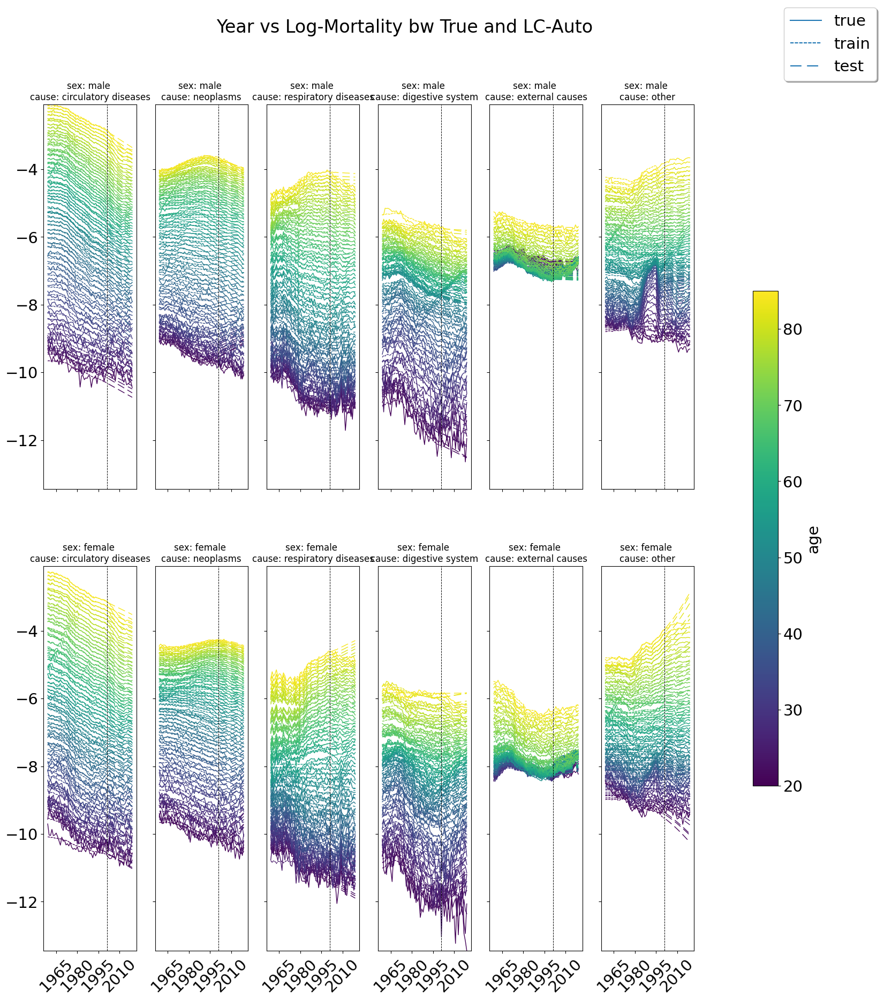

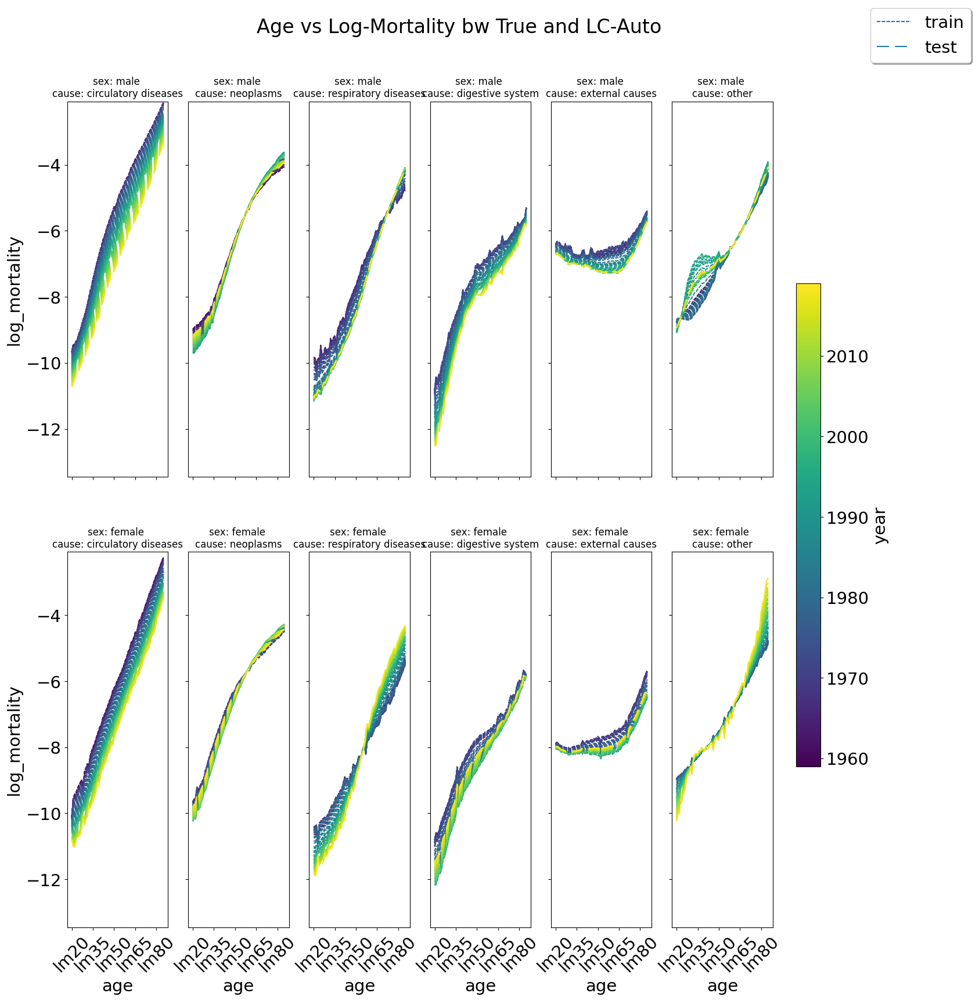

In [132]:
%matplotlib inline
data_hmd_hat_st_auto = HmdMortalityData(df_pred_lc_auto, df_e)  
df_pred_lc_auto_long = data_hmd_hat_st_auto.to_long(py_hmd_data.TYPE_DATA_LM)
df_pred_lc_auto_long[py_params.COL_TYPE] = py_params.TYPE_TRAIN
df_pred_lc_auto_long.loc[(df_pred_lc_auto_long.year > YEAR_END), py_params.COL_TYPE] = py_params.TYPE_TEST

df_all_lc_auto_long = pd.concat((df_lm_long, df_pred_lc_auto_long), ignore_index=True)
y_min = df_all_lc_auto_long['log_mortality'].min()
y_max = df_all_lc_auto_long['log_mortality'].max()

py_utils.plot_year_value(df_final_long=df_all_lc_auto_long,
                         value='log_mortality',
                         row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                         col_feature_name='cause', col_feature_values=list(df_all_lc_auto_long['cause'].unique()),
                         col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                         hue_feature_name='age', hue_feature_values=df_all_lc_auto_long.age.unique(),
                         types=df_all_lc_auto_long.type.unique(), 
                         years=data_hmd.years,
                         year_separators=[YEAR_END],
                         title_fig="Year vs Log-Mortality bw True and LC-Auto",
                         is_fig_saved = False,
                         y_limit = [y_min, y_max])

predictions_types = [each_type for each_type in df_all_lc_rwd_long.type.unique() if each_type != py_params.TYPE_TRUE]
py_utils.plot_age_mortality_year(df_all_lc_auto_long,
                            row_feature_name='sex', row_feature_values=[1,2], 
                            row_labels=py_params.BIDICT_SEX_1_2,
                            col_feature_name='cause', 
                            col_feature_values=df_all_lc_auto_long['cause'].unique(),
                            col_labels=dict(py_params.BIDICT_CAUSE_1_HMD),
                            hue_feature_name='year',                            
                            hue_feature_values=df_all_lc_auto_long.year.unique(),
                            types=predictions_types,
                            title_fig = "Age vs Log-Mortality bw True and LC-Auto",
                            is_fig_saved=False,
                            ages=list(df_all_lc_auto_long['age'].unique()), y_limit=[y_min, y_max])

#### Year vs Log-Mortality (per 5 Ages)

In [133]:
%matplotlib inline

def year_mortality(**kwargs):
      # Determine the checked ages      
      ages_included = []
      for key, value in kwargs.items():
            if(value):
                  curr_ages = key.split("-")
                  ages_included = ages_included + [f"lm{age}" for age in list(range(int(curr_ages[0]), int(curr_ages[1])))]

      # Create figure title
      title = f"Year vs Log-Mortality bw True and LC-Auto ({[list(kwargs.keys())[i] for i in range(0, len(kwargs)) if list(kwargs.values())[i]]})"      
      # Plot based on the checked ages
      py_utils.plot_year_value(df_final_long=df_all_lc_auto_long,
                               value='log_mortality',
                               row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                               col_feature_name='cause', col_feature_values=list(df_all_lc_auto_long['cause'].unique()),
                               col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                               hue_feature_name='age', 
                               hue_feature_values=ages_included,
                               types=df_all_lc_auto_long.type.unique(), 
                               years=data_hmd.years,
                               year_separators=[YEAR_END],
                               title_fig=title,
                               is_fig_saved = False,
                               is_true_dotted=False,
                               y_limit = [y_min, y_max])


# Extract number for the age column
num_age = []
for age in df_all_lc_auto_long.age.unique():
      num = [each for each in age if str(each).isdigit()]
      num = int(''.join(num))
      num_age.append(num)

# Simple checking whether ages are given in single-year format or in a age-group format
# Plots will only be drawn when there are too many ages to be drawn
if len(num_age) > 20:
      # Determine grouping and create a checkbox for each group
      interval = 5
      num_groups = len(num_age)//interval
      groups = []
      checks = []
      age_start = min(num_age)
      for idx_group in range(0, num_groups):
            groups.append(f"{age_start}-{age_start+interval-1}")
            checks.append(widgets.Checkbox(False, description=groups[-1]))
            age_start = age_start + interval
      ui = widgets.GridBox(children=checks,
                           layout=widgets.Layout( width='60%',
                                                 grid_template_columns='25% 25% 25% 25%',
                                                 grid_template_rows='25% 25% 25% 25%',
                                                 grid_gap='5px 5px'))  
      
      out = widgets.interactive_output(year_mortality, {key:value for key, value in zip(groups, checks)})
      display(ui, out)
      

GridBox(children=(Checkbox(value=False, description='20-24'), Checkbox(value=False, description='25-29'), Chec…

Output()

### Auto Arima vs Random Walk

In [134]:
df_pred_lc_auto_long.loc[:, 'type'] = 'lc_auto'
df_pred_lc_rwd_long.loc[:, 'type'] = 'lc_rwd'
df_all_lc_long = pd.concat((df_lm_long, df_pred_lc_rwd_long, df_pred_lc_auto_long), ignore_index=True)

#### Age vs Log-Mortality

In [135]:
%matplotlib inline
# %matplotlib widget
# %matplotlib widget

idx_sex = 1
idx_cause = 1
nbins = 10
year_test = list(range(YEAR_END+1, max(data_hmd.years)))


def f(year):
    py_utils.plot_age_mortality_model(df_all_lc_long,
                                      row_feature_name='sex', row_feature_values=[1,2], 
                                      row_labels=py_params.BIDICT_SEX_1_2,
                                      col_feature_name='cause', 
                                      col_feature_values=df_all_lc_long['cause'].unique(),
                                      col_labels=dict(py_params.BIDICT_CAUSE_1_HMD),
                                      years=[year],
                                      types=df_all_lc_long.type.unique(),
                                      title_fig = f"Age vs Log-Mortality for True, LC-RWD, and LC-Auto ({year} - {'train' if year <= YEAR_END else 'test'})",
                                      is_fig_saved=False,
                                      ages=list(df_all_lc_long['age'].unique()), y_limit=[y_min, y_max])

interact(f, year = widgets.IntSlider(min = min(data_hmd.years), max = max(data_hmd.years), step=1,
                                     value=YEAR_END+1, description="year", continuous_update=False));
# interact(f, year = (min(data_hmd.years), max(data_hmd.years), 1))

interactive(children=(IntSlider(value=2002, continuous_update=False, description='year', max=2019, min=1959), …

In [136]:
%matplotlib inline

# Data preparation
df_all_lc_long_surface = df_all_lc_long.copy()
df_all_lc_long_surface.loc[:, 'age'] = df_all_lc_long_surface.loc[:,'age'].str[2:].astype(int)

# for each year
@interact(sex = list(py_params.BIDICT_SEX_1_2.values())[0:2], cause=list(py_params.BIDICT_CAUSE_1_HMD.values())[1:])
def f(sex, cause):
    # Data preparation
    Y = df_all_lc_long_surface.year.unique()
    X = df_all_lc_long_surface.age.unique()
    X, Y = np.meshgrid(X, Y)
    idx_country = 'USA'
    cs = [[1,0,0,1], [0,1,0,1], [0,0,1,1]]
    z_min = df_all_lc_long_surface.log_mortality.min()
    z_max = df_all_lc_long_surface.log_mortality.max()

    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=(8,6), subplot_kw={"projection": "3d"})
    fig.suptitle(f'{sex}-{cause} (all ages)')

    # get the code for sex and cause
    cause = py_params.BIDICT_CAUSE_1_HMD.inverse[cause]
    sex = py_params.BIDICT_SEX_1_2.inverse[sex]

    # filter the data based on the selected sex and cause
    for idx_type, curr_type in enumerate(df_all_lc_long_surface.type.unique()):
        LM = df_all_lc_long_surface.loc[(df_all_lc_long_surface.cause == cause) &
                        (df_all_lc_long_surface.sex == sex) & 
                        (df_all_lc_long_surface.type == curr_type)].pivot(index='year', columns='age', values='log_mortality').values 
        
        # Plot the surface
        if(curr_type == py_params.TYPE_TRUE):
            curr_linestyle = '-'
        else:
            curr_linestyle= py_params.LINESTYLES[idx_type]     

        ax.plot_wireframe(X, Y, LM, cstride=0, rstride=10, color=cs[idx_type], label = curr_type, linestyle=curr_linestyle);
        ax.set_zlim(z_min, z_max) 

    ax.set_title(f"{py_params.BIDICT_SEX_1_2[1]}")
    ax.set_xlabel('ages')
    ax.set_ylabel('years')
    ax.set_zlabel('log_mortality')
    fig.legend()
    plt.show();

interactive(children=(Dropdown(description='sex', options=('male', 'female'), value='male'), Dropdown(descript…

#### Year vs Log-Mortality (per 5 ages)

In [137]:
%matplotlib inline

def year_mortality(**kwargs):
      # Determine the checked ages      
      ages_included = []
      for key, value in kwargs.items():
            if(value):
                  curr_ages = key.split("-")
                  ages_included = ages_included + [f"lm{age}" for age in list(range(int(curr_ages[0]), int(curr_ages[1])))]

      # Create figure title
      title = f"Year vs Log-Mortality bw True, LC-rwd, and LC-Auto ({[list(kwargs.keys())[i] for i in range(0, len(kwargs)) if list(kwargs.values())[i]]})"      
      # Plot based on the checked ages
      py_utils.plot_year_value(df_final_long=df_all_lc_long,
                               value='log_mortality',
                               row_feature_name='sex', row_feature_values=[1,2], row_labels=dict(py_params.BIDICT_SEX_1_2),
                               col_feature_name='cause', col_feature_values=list(df_all_lc_long['cause'].unique()),
                               col_labels = dict(py_params.BIDICT_CAUSE_1_HMD),
                               hue_feature_name='age', 
                               hue_feature_values=ages_included,
                               types=df_all_lc_long.type.unique(), 
                               years=data_hmd.years,
                               year_separators=[YEAR_END],
                               title_fig=title,
                               is_fig_saved = False,
                               is_true_dotted=False,
                               y_limit = [y_min, y_max])


# Extract number for the age column
num_age = []
for age in df_all_lc_long.age.unique():
      num = [each for each in age if str(each).isdigit()]
      num = int(''.join(num))
      num_age.append(num)

# Simple checking whether ages are given in single-year format or in a age-group format
# Plots will only be drawn when there are too many ages to be drawn
if len(num_age) > 20:
      # Determine grouping and create a checkbox for each group
      interval = 5
      num_groups = len(num_age)//interval
      groups = []
      checks = []
      age_start = min(num_age)
      for idx_group in range(0, num_groups):
            groups.append(f"{age_start}-{age_start+interval-1}")
            checks.append(widgets.Checkbox(False, description=groups[-1]))
            age_start = age_start + interval
      ui = widgets.GridBox(children=checks,
                           layout=widgets.Layout( width='60%',
                                                 grid_template_columns='25% 25% 25% 25%',
                                                 grid_template_rows='25% 25% 25% 25%',
                                                 grid_gap='5px 5px'))  
      
      out = widgets.interactive_output(year_mortality, {key:value for key, value in zip(groups, checks)})
      display(ui, out)
      

GridBox(children=(Checkbox(value=False, description='20-24'), Checkbox(value=False, description='25-29'), Chec…

Output()

## Analyze the Residual

In [138]:
res_rwd = py_hmd_data.HmdResidualData(df_true_long=data_hmd.to_long(data_type=py_hmd_data.TYPE_DATA_LM, start_age=AGE_START, end_age=AGE_END),
                                      df_pred_long=data_hmd_hat_st_rwd.to_long(data_type=py_hmd_data.TYPE_DATA_LM),
                                      year_train_end=YEAR_END, data_type=py_hmd_data.TYPE_DATA_LM)
res_auto = py_hmd_data.HmdResidualData(df_true_long=data_hmd.to_long(data_type=py_hmd_data.TYPE_DATA_LM, start_age=AGE_START, end_age=AGE_END),
                                      df_pred_long=data_hmd_hat_st_auto.to_long(data_type=py_hmd_data.TYPE_DATA_LM),
                                      year_train_end=YEAR_END, data_type=py_hmd_data.TYPE_DATA_LM)

df_errors = pd.DataFrame(columns=['model', 'sex', 'type', 'measure', 'log_mortality'])
df_year_errors =  pd.DataFrame(columns=['model', 'sex', 'year', 'type', 'measure', 'log_mortality'])
df_age_errors =  pd.DataFrame(columns=['model', 'sex', 'age', 'type', 'measure', 'log_mortality'])
df_cause_errors =  pd.DataFrame(columns=['model', 'sex', 'cause', 'type', 'measure', 'log_mortality'])
df_causeyear_errors =  pd.DataFrame(columns=['model', 'sex', 'year', 'cause', 'type', 'measure', 'log_mortality'])

# Residuals for each combination of cause and age are not calculated because the sample size is too small.
# df_causeage_errors =  pd.DataFrame(columns=['model', 'sex', 'age', 'cause', 'type', 'measure', 'log_mortality'])

# res_rwd.df_res.groupby(by=['country', 'type']).count().min().iloc[0]
# res_rwd.df_res.groupby(by=['country', 'sex', 'year', 'cause', 'type']).count().min().iloc[0]

# by = ['country', 'type']
# by = ['country', 'sex', 'type', 'year']
# res_rwd.df_res.groupby(by=by)['log_mortality'].mean()
# res_rwd.df_res.groupby(by=by).mean().reset_index()
# res_rwd.error(by=['country', 'sex', 'type', 'year'], error_type=py_hmd_data.TYPE_ERROR_MAE)
# res_rwd.error(by=None, error_type=py_hmd_data.TYPE_ERROR_MAE)
# res_rwd.df_res
# np.mean(np.abs(res_rwd.df_res['log_mortality'].values))

### Interactive Heatmap

In [139]:
# @interact(sex=res_rwd.df_res.sex.unique(), cause=res_rwd.df_res.cause.unique())
# def heatmap(sex, cause):
#     matplotlib.rcParams.update(matplotlib.rcParamsDefault)
#     res_rwd.heatmap(sex, cause)

@interact(cause=res_rwd.df_res.cause.unique())
def heatmap(cause):    
    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(12, 5))
    fig.suptitle(f"Residual Heatmaps")    
    res_rwd.heatmap(1, cause, axs[0])
    res_rwd.heatmap(2, cause, axs[1])
    plt.show();

interactive(children=(Dropdown(description='cause', options=(1, 2, 3, 4, 5, 6), value=1), Output()), _dom_clas…

### See the overall errors

In [140]:
for error_type in [py_hmd_data.TYPE_ERROR_MAE, py_hmd_data.TYPE_ERROR_MSE, 
                   py_hmd_data.TYPE_ERROR_MAPE]:
    # Add errors from LC-RWD model
    df_temp = res_rwd.error(by=['type', 'sex'], error_type=error_type)
    df_temp['model'] = 'LC-rwd'
    df_temp['measure'] = error_type
    df_errors = pd.concat((df_errors, df_temp))
    
    # Add errors from LC-Auto model
    df_temp = res_auto.error(by=['type', 'sex'], error_type=error_type)
    df_temp['model'] = 'LC-auto'
    df_temp['measure'] = error_type
    df_errors = pd.concat((df_errors, df_temp))
df_errors

C:\Users\dkrisnad\AppData\Local\Temp\ipykernel_13036\3443008852.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_errors = pd.concat((df_errors, df_temp))


,model,sex,type,measure,log_mortality
0,LC-rwd,1,test,mae,0.255610
1,LC-rwd,1,train,mae,0.066898
2,LC-rwd,2,test,mae,0.214868
3,LC-rwd,2,train,mae,0.084240
0,LC-auto,1,test,mae,0.254318
1,LC-auto,1,train,mae,0.066898
2,LC-auto,2,test,mae,0.225584
3,LC-auto,2,train,mae,0.084240
0,LC-rwd,1,test,mse,0.101719
1,LC-rwd,1,train,mse,0.008715


### See error for each year (separated train and test)

In [141]:
for error_type in [py_hmd_data.TYPE_ERROR_MAE, py_hmd_data.TYPE_ERROR_MSE, 
                   py_hmd_data.TYPE_ERROR_MAPE]:
    # Add errors from LC-RWD model
    df_temp = res_rwd.error(by=['country', 'sex', 'year', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-rwd'
    df_temp['measure'] = error_type     
    df_year_errors = pd.concat((df_year_errors, df_temp.drop(columns=['country'])  ))
    
    # Add errors from LC-Auto model
    df_temp = res_auto.error(by=['country', 'sex', 'year', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-auto'
    df_temp['measure'] = error_type
    df_year_errors = pd.concat((df_year_errors, df_temp.drop(columns=['country'])  ))
df_year_errors

C:\Users\dkrisnad\AppData\Local\Temp\ipykernel_13036\2914385421.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_year_errors = pd.concat((df_year_errors, df_temp.drop(columns=['country'])  ))


,model,sex,year,type,measure,log_mortality
0,LC-rwd,1,1959,train,mae,0.100892
1,LC-rwd,2,1959,train,mae,0.129868
2,LC-rwd,1,1960,train,mae,0.091465
3,LC-rwd,2,1960,train,mae,0.140576
4,LC-rwd,1,1961,train,mae,0.093549
...,...,...,...,...,...,...
117,LC-auto,2,2017,test,mape,0.041822
118,LC-auto,1,2018,test,mape,0.050583
119,LC-auto,2,2018,test,mape,0.043798
120,LC-auto,1,2019,test,mape,0.053263


### See error for each age (separated by train and test)

In [142]:
for error_type in [py_hmd_data.TYPE_ERROR_MAE, py_hmd_data.TYPE_ERROR_MSE, 
                   py_hmd_data.TYPE_ERROR_MAPE]:
    # Add errors from LC-RWD model
    df_temp = res_rwd.error(by=['country', 'sex', 'age', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-rwd'
    df_temp['measure'] = error_type     
    df_age_errors = pd.concat((df_age_errors, df_temp.drop(columns=['country'])))
    
    # Add errors from LC-Auto model
    df_temp = res_auto.error(by=['country', 'sex', 'age', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-auto'
    df_temp['measure'] = error_type     
    df_age_errors = pd.concat((df_age_errors, df_temp.drop(columns=['country'])))
df_age_errors

C:\Users\dkrisnad\AppData\Local\Temp\ipykernel_13036\853786600.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_age_errors = pd.concat((df_age_errors, df_temp.drop(columns=['country'])))


,model,sex,age,type,measure,log_mortality
0,LC-rwd,1,lm20,test,mae,0.280824
1,LC-rwd,1,lm20,train,mae,0.125629
2,LC-rwd,2,lm20,test,mae,0.222602
3,LC-rwd,2,lm20,train,mae,0.164981
4,LC-rwd,1,lm21,test,mae,0.280555
...,...,...,...,...,...,...
259,LC-auto,2,lm84,train,mape,0.009642
260,LC-auto,1,lm85,test,mape,0.038871
261,LC-auto,1,lm85,train,mape,0.013501
262,LC-auto,2,lm85,test,mape,0.044467


### See error for each cause (separated by train and test)

In [143]:
for error_type in [py_hmd_data.TYPE_ERROR_MAE, py_hmd_data.TYPE_ERROR_MSE, 
                   py_hmd_data.TYPE_ERROR_MAPE]:
    # Add errors from LC-RWD model
    df_temp = res_rwd.error(by=['country', 'sex', 'cause', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-rwd'
    df_temp['measure'] = error_type     
    df_cause_errors = pd.concat((df_cause_errors, df_temp.drop(columns=['country'])))
    
    # Add errors from LC-Auto model
    df_temp = res_auto.error(by=['country', 'sex', 'cause', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-auto'
    df_temp['measure'] = error_type     
    df_cause_errors = pd.concat((df_cause_errors, df_temp.drop(columns=['country'])))
df_cause_errors

C:\Users\dkrisnad\AppData\Local\Temp\ipykernel_13036\938235179.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_cause_errors = pd.concat((df_cause_errors, df_temp.drop(columns=['country'])))


,model,sex,cause,type,measure,log_mortality
0,LC-rwd,1,1,test,mae,0.242014
1,LC-rwd,1,1,train,mae,0.042403
2,LC-rwd,2,1,test,mae,0.245331
3,LC-rwd,2,1,train,mae,0.056425
4,LC-rwd,1,2,test,mae,0.332879
...,...,...,...,...,...,...
19,LC-auto,2,5,train,mape,0.010157
20,LC-auto,1,6,test,mape,0.044807
21,LC-auto,1,6,train,mape,0.012467
22,LC-auto,2,6,test,mape,0.026870


#### See error for each cause and year

In [144]:
for error_type in [py_hmd_data.TYPE_ERROR_MAE, py_hmd_data.TYPE_ERROR_MSE, 
                   py_hmd_data.TYPE_ERROR_MAPE]:
    # Add errors from LC-RWD model
    df_temp = res_rwd.error(by=['country', 'sex', 'cause', 'year', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-rwd'
    df_temp['measure'] = error_type     
    df_causeyear_errors = pd.concat((df_causeyear_errors, df_temp.drop(columns=['country'])))
    # Add errors from LC-Auto model
    df_temp = res_auto.error(by=['country', 'sex', 'cause', 'year', 'type'], error_type=error_type)
    df_temp['model'] = 'LC-auto'
    df_temp['measure'] = error_type     
    df_causeyear_errors = pd.concat((df_causeyear_errors, df_temp.drop(columns=['country'])))
df_causeyear_errors

C:\Users\dkrisnad\AppData\Local\Temp\ipykernel_13036\2451643581.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_causeyear_errors = pd.concat((df_causeyear_errors, df_temp.drop(columns=['country'])))


,model,sex,year,cause,type,measure,log_mortality
0,LC-rwd,1,1959,1,train,mae,0.061942
1,LC-rwd,1,1959,2,train,mae,0.072678
2,LC-rwd,1,1959,3,train,mae,0.158603
3,LC-rwd,1,1959,4,train,mae,0.100583
4,LC-rwd,1,1959,5,train,mae,0.118207
...,...,...,...,...,...,...,...
727,LC-auto,2,2019,2,test,mape,0.063230
728,LC-auto,2,2019,3,test,mape,0.059976
729,LC-auto,2,2019,4,test,mape,0.031054
730,LC-auto,2,2019,5,test,mape,0.032667


### Make Visualization of The Various Errors

#### Overall Errors (Bar Plot)
Separate bar plot for each combination of `sex` and `type`. Each bar plot will have `measure` as its x-axis, and the error from various models are plotted in different colour.

In [145]:
df_errors.sort_values(by=['sex', 'type','measure', 'model']).head(4)

,model,sex,type,measure,log_mortality
0,LC-auto,1,test,mae,0.254318
0,LC-rwd,1,test,mae,0.255610
0,LC-auto,1,test,mape,0.035552
0,LC-rwd,1,test,mape,0.037129


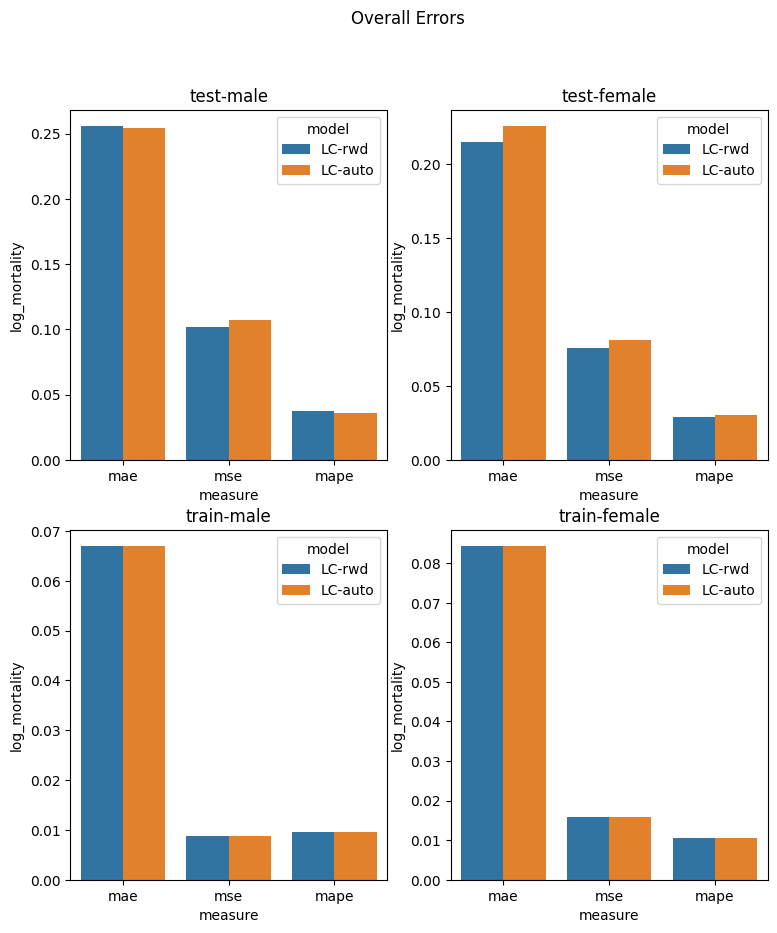

In [146]:
# Create a figure    
sexes = df_errors.sex.unique()
types = df_errors.type.unique()
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
fig, axs = plt.subplots(ncols=len(sexes), nrows=len(types), figsize=(9, 10))
fig.suptitle(f"Overall Errors")

# Plot separate surfaces for each selected cause
for idx_type, each_type in enumerate(types):
    for idx_sex, each_sex in enumerate(sexes):    
        # Plot the barplot
        curr_ax = axs[idx_type, idx_sex]
        sns.barplot(x='measure', y='log_mortality', hue='model', 
                    data=df_errors.loc[(df_errors.type == each_type) & (df_errors.sex==each_sex),:],
                    ax=curr_ax, errorbar=None)

        # Put information
        curr_ax.set_title(f"{each_type}-{py_params.BIDICT_SEX_1_2[each_sex]}")        

plt.show();

#### Error by Year (Line Plot) 
Separate line plot for each combination of `sex` and `type`. Each line plot will have `year` as its x-axis, and the error from various models are plotted in different colour. The `measure` variable will be used as an interactive filter.

In [147]:
df_year_errors.head(2)

,model,sex,year,type,measure,log_mortality
0,LC-rwd,1,1959,train,mae,0.100892
1,LC-rwd,2,1959,train,mae,0.129868


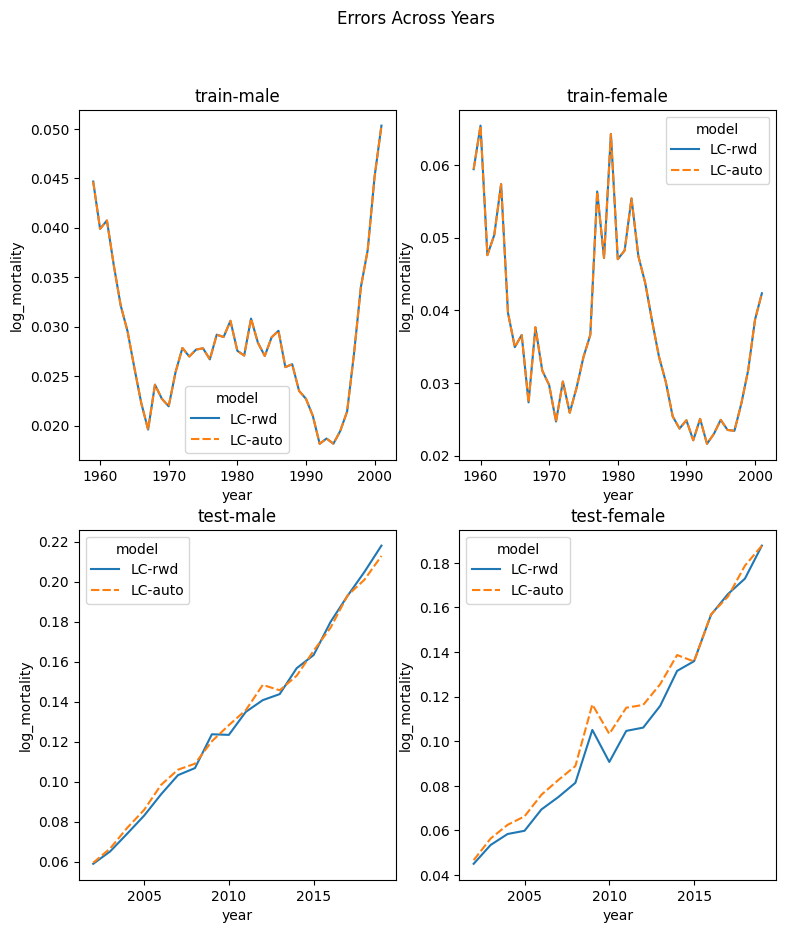

In [148]:
# Create a figure    
sexes = df_year_errors.sex.unique()
types = df_year_errors.type.unique()
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
fig, axs = plt.subplots(ncols=len(sexes), nrows=len(types), figsize=(9, 10))
fig.suptitle(f"Errors Across Years")

# Plot separate surfaces for each selected cause
for idx_type, each_type in enumerate(types):
    for idx_sex, each_sex in enumerate(sexes):    
        # Plot the barplot
        curr_ax = axs[idx_type, idx_sex]
        sns.lineplot(x='year', y='log_mortality', hue='model', style='model',
                     data=df_year_errors.loc[(df_year_errors.type == each_type) & 
                                             (df_year_errors.sex==each_sex),:],
                     ax=curr_ax, errorbar=None)

        # Put information
        curr_ax.set_title(f"{each_type}-{py_params.BIDICT_SEX_1_2[each_sex]}")        

plt.show();

#### Error by Age (Line Plot)
Separate line plot for each combination of `sex` and `type`. Each line plot will have `age` as its x-axis, and the error from various models are plotted in different colour. The `measure` variable will be used as an interactive filter.

In [149]:
df_age_errors.head(2)

,model,sex,age,type,measure,log_mortality
0,LC-rwd,1,lm20,test,mae,0.280824
1,LC-rwd,1,lm20,train,mae,0.125629


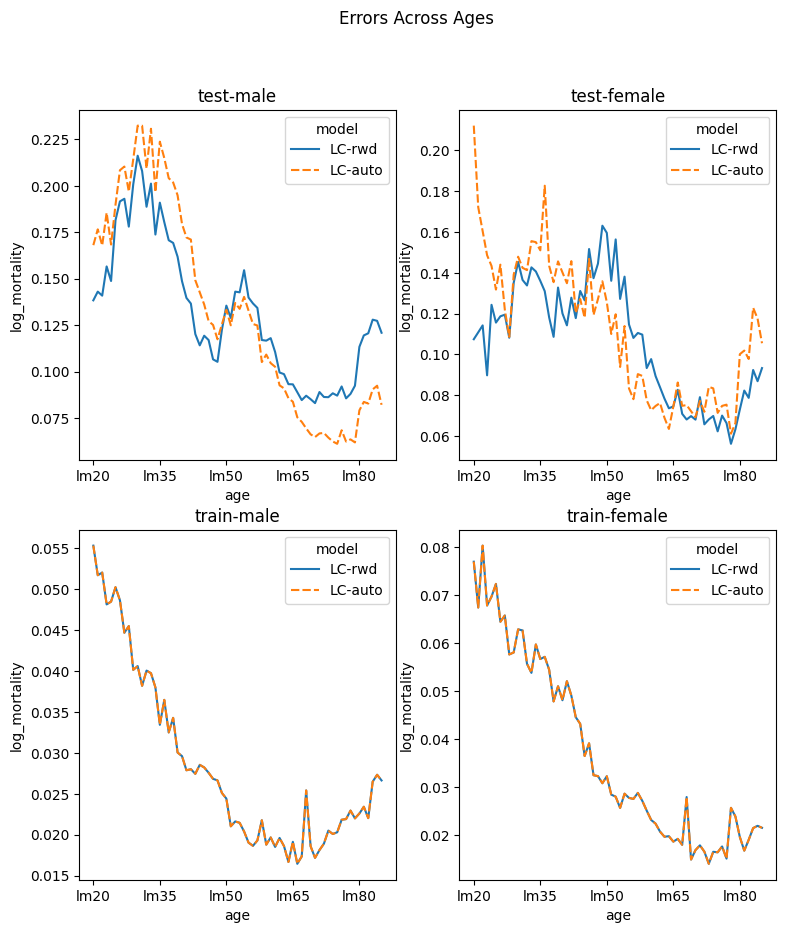

In [150]:
# Create a figure    
sexes = df_age_errors.sex.unique()
types = df_age_errors.type.unique()
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
fig, axs = plt.subplots(ncols=len(sexes), nrows=len(types), figsize=(9, 10))
fig.suptitle(f"Errors Across Ages")

# Plot separate surfaces for each selected cause
for idx_type, each_type in enumerate(types):
    for idx_sex, each_sex in enumerate(sexes):    
        # Plot the barplot
        curr_ax = axs[idx_type, idx_sex]
        sns.lineplot(x='age', y='log_mortality', hue='model', style='model',
                     data=df_age_errors.loc[(df_age_errors.type == each_type) & 
                                            (df_age_errors.sex==each_sex),:],
                     ax=curr_ax, errorbar=None)

        # Put information
        curr_ax.set_title(f"{each_type}-{py_params.BIDICT_SEX_1_2[each_sex]}")       
        curr_ax.xaxis.set_major_locator(plt.MaxNLocator(6)) 

plt.show();

#### Error by Cause (Bar Plot)
Separate bar plot for each combination of `sex` and `type`. Each bar plot will have `cause` as its x-axis, and the error from various models are plotted in different colour. The `measure` variable will be used as an interactive filter.

In [151]:
df_cause_errors.head(5)

,model,sex,cause,type,measure,log_mortality
0,LC-rwd,1,1,test,mae,0.242014
1,LC-rwd,1,1,train,mae,0.042403
2,LC-rwd,2,1,test,mae,0.245331
3,LC-rwd,2,1,train,mae,0.056425
4,LC-rwd,1,2,test,mae,0.332879


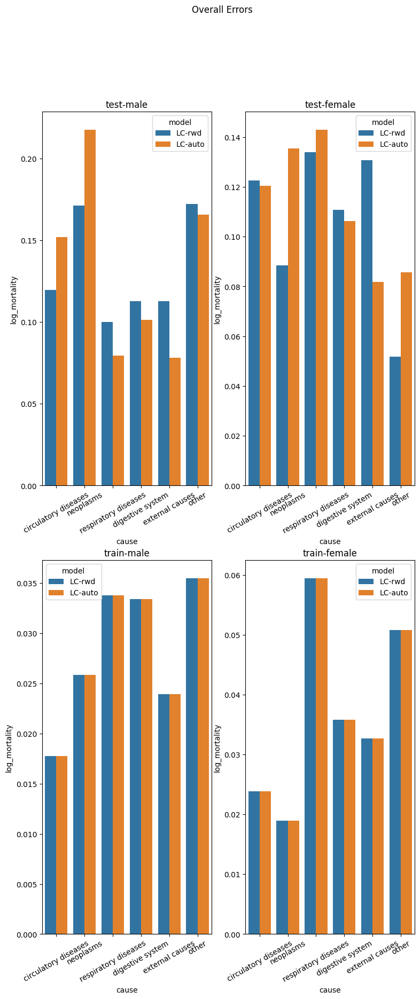

In [152]:
# Create a figure    
sexes = df_cause_errors.sex.unique()
types = df_cause_errors.type.unique()
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
fig, axs = plt.subplots(ncols=len(sexes), nrows=len(types), figsize=(9, 20))
fig.suptitle(f"Overall Errors")

# Plot separate surfaces for each selected cause
for idx_type, each_type in enumerate(types):
    for idx_sex, each_sex in enumerate(sexes):    
        # Plot the barplot
        curr_ax = axs[idx_type, idx_sex]
        plot = sns.barplot(x='cause', y='log_mortality', hue='model', 
                           data=df_cause_errors.loc[(df_cause_errors.type == each_type) & 
                                                    (df_cause_errors.sex==each_sex),:],
                           ax=curr_ax, errorbar=None)
        plot.set_xticks(range(len(df_cause_errors.cause.unique())), 
                        labels=list(py_params.BIDICT_CAUSE_1_HMD.values())[1:])
        # Put information
        curr_ax.set_title(f"{each_type}-{py_params.BIDICT_SEX_1_2[each_sex]}")   
        curr_ax.tick_params(axis='x', rotation=30)        

plt.show();

#### Error vs Exposures (Line Plot)
Separate line plot for each combination of `sex` and `type`. Each line plot will have `exposure` as its x-axis, and the error from various models are plotted in different colour. The `measure` variable will be used as an interactive filter.
`Exposure` is unique for each combination of `age` and `year` variables, with a specific ordering. Therefore, the mean error for each combination of `age` and `year` will be used (only have 6 samples for the 6 causes)

#### Error vs Deaths (Line Plot)
Separate line plot for each combination of `sex` and `type`. Each line plot will have `exposure` as its x-axis (similar to `year`, but different point-of-view or ordering), and the error from various models are plotted in different colour. The `measure` variable will be used as an interactive filter.

In [153]:
# Check for duplicates
u, c = np.unique(df_e.iloc[:,4:].values, return_counts=True)
dup = (u[c > 1], c[c > 1],)
dup

# import numpy as np
# from collections import Counter
# a = df_d.iloc[:,4:].values.flatten()
# len([item for item, count in Counter(a).items() if count > 1])

(array([], dtype=float64), array([], dtype=int64))

#### Error vs Measure of Variability (Line Plot) - TBD

## RH Model

In [154]:
# # get the predictions for fitted data
# kt_hat, idx_fitted, mxt_hat_fitted, res_fitted = model_lc.predict(horizon=0, order=None)        

# # get the predictions for test data
# mxt_test, _, _ = data_hmd.get_mxt(year_start=YEAR_END+1, year_end=data_hmd.years[-1], 
#                             age_start=AGE_START, age_end=AGE_END,
#                             sex=idx_sex, cause=idx_cause, country=idx_country)

# kt_hat_test, gz_hat_test, idx_test, mxt_hat_test, res_test = model_rh.predict(horizon=len([year for year in data_hmd.years if year > YEAR_END]), 
#                                                                                 order_kt=None, order_gz=None,
#                                                                                 mxt_true=mxt_test)        
        
# # put all the predictions together into a dataframe
# df_curr_rh = pd.DataFrame(np.append(mxt_hat_fitted, mxt_hat_test, axis=1).T, columns=features_m)
# df_curr_rh.insert(0, 'cause', idx_cause)
# df_curr_rh.insert(0, 'sex', idx_sex)
# df_curr_rh.insert(0, 'year', np.append(idx_fitted, idx_test))
# df_curr_rh.insert(0, 'country', idx_country)
# if df_pred_rh is None:
#     df_pred_rh = df_curr_rh.copy()
# else:
#     df_pred_rh = pd.concat([df_pred_rh, df_curr_rh], ignore_index=True)

# # store the model in a dataframe
# df_curr_model_rh = pd.DataFrame({'sex': [idx_sex], 'cause': [idx_cause], 'model': [model_lc], 'order': [model_lc.order], 'kt_hat_test': [kt_hat_test]})
# if df_models_rh is None:
#     df_models_rh = df_curr_model_rh.copy()
# else:
#     df_models_rh = pd.concat([df_models_rh, df_curr_model_rh], ignore_index=True)             

In [155]:
# temp1, temp2, temp3, _ = lc_svd_est(np.log(mxt))
# model_rh.params['bx_2']
# temp4, temp5, temp6, _ = lc_poisson_est(mxt, ext)
# temp7, temp8, temp9, temp10, temp11, _ = rh_poisson_est(mxt, ext, 0, 0)

In [156]:
# mxt_hat, idx_year, res = model_lc.predict()
# print(f"===Fitted Data===")
# print(f"Average residuals: {np.mean(np.abs(res))}")
# print(f"MSE: {np.mean(np.square(res))}")

# mxt_hat_test, idx_year_test, res_test = model_lc.predict(horizon=18, order=(0, 1, 0), mxt_true=mxt_test)
# print(f"===Out-of-sample Data===")
# print(f"Average residuals: {np.mean(np.abs(res_test))}")
# print(f"MSE: {np.mean(np.square(res_test))}")

In [157]:
####################
        # build the RH model
        ####################
        # print(f"=======================================================")
        # print(f"Building an RH model (sex:{idx_sex}, cause:{idx_cause})")
        # model_rh = Rh(0, 0)
        # model_rh.fit(mxt, ext, year_start=years[0], year_end=years[-1])
                                
        # # get the predictions for fitted data
        # kt_hat, idx_fitted, mxt_hat_fitted, res_fitted = model_lc.predict(horizon=0, order=None)        

        # # get the predictions for test data
        # mxt_test, _, _ = data_hmd.get_mxt(year_start=YEAR_END+1, year_end=data_hmd.years[-1], 
        #                             age_start=AGE_START, age_end=AGE_END,
        #                             sex=idx_sex, cause=idx_cause, country=idx_country)
        
        # kt_hat_test, gz_hat_test, idx_test, mxt_hat_test, res_test = model_rh.predict(horizon=len([year for year in data_hmd.years if year > YEAR_END]), 
        #                                                                               order_kt=None, order_gz=None,
        #                                                                               mxt_true=mxt_test)        
                
        # # put all the predictions together into a dataframe
        # df_curr_rh = pd.DataFrame(np.append(mxt_hat_fitted, mxt_hat_test, axis=1).T, columns=features_m)
        # df_curr_rh.insert(0, 'cause', idx_cause)
        # df_curr_rh.insert(0, 'sex', idx_sex)
        # df_curr_rh.insert(0, 'year', np.append(idx_fitted, idx_test))
        # df_curr_rh.insert(0, 'country', idx_country)
        # if df_pred_rh is None:
        #     df_pred_rh = df_curr_rh.copy()
        # else:
        #     df_pred_rh = pd.concat([df_pred_rh, df_curr_rh], ignore_index=True)

        # # store the model in a dataframe
        # df_curr_model_rh = pd.DataFrame({'sex': [idx_sex], 'cause': [idx_cause], 'model': [model_lc], 'order': [model_lc.order], 'kt_hat_test': [kt_hat_test]})
        # if df_models_rh is None:
        #     df_models_rh = df_curr_model_rh.copy()
        # else:
        #     df_models_rh = pd.concat([df_models_rh, df_curr_model_rh], ignore_index=True)           